In [1]:
import scanpy as sc
import pandas as pd   
import numpy as np
from umap import UMAP
from sklearn.cluster import KMeans

2024-03-27 23:56:20.527406: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


2024-03-27 23:56:21.114603: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


# SLN_mergeAll_111_206 data

## GraphCrossATTN - whole genes

### protein intersect

#### leiden

##### load constructed RNA matrix

In [2]:
datapath = '/data2/wangxf/jupyter_notebook/SpatialTranscriptome/wuxc/GraphCrossATTN/'

In [3]:
import muon as mu
mdata = mu.read_h5mu('./SLM_mergeAll_111_206.h5mu')
mdata

/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/mudata/_core/mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


MuData object with n_obs × n_vars = 32648 × 17760
  obs:	'_scvi_labels', '_scvi_raw_norm_scaling'
  uns:	'_scvi_manager_uuid', '_scvi_uuid'
  3 modalities
    rna:	32648 x 13553
      obs:	'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
      uns:	'hvg', 'log1p'
      layers:	'counts'
    protein:	32648 x 207
      obs:	'_scvi_batch'
      var:	'clean_names'
      layers:	'denoised_protein', 'protein_foreground_prob'
    rna_subset:	32648 x 4000
      obs:	'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', '_scvi_batch', 'leiden_totalVI'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
      uns:	'hvg', 'leiden', 'log1p', 'neighbors', 'rna_subset:batch_colors', 'rna_subset:leiden_totalVI_colors', 'umap'
      obsm:	'X_totalVI', 'X_umap'
      layers:	'counts', 'denoised_rna'
      obsp:	'connectivities', 'distances'

In [6]:
import anndata as ad
# adata = ad.AnnData(X=exp)#, obs=obs_info, var=var_info
adata = mdata['rna']
adata

AnnData object with n_obs × n_vars = 32648 × 13553
    obs: 'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg', 'log1p'
    layers: 'counts'

In [7]:
embedding = np.load(datapath + 'GraphCrossEmbedding_combined_whole_trans_intersect_SLN_scCITE.npy')
embedding.shape

(32648, 32)

In [8]:
adata.obsm['X_GCAT'] = embedding

In [9]:
adata.obs['panel']=adata.obs['panel'].astype('category')
adata.obs['batch_indices']=adata.obs['batch_indices'].astype('category')
adata.obs['batch']=adata.obs['batch'].astype('category')

In [10]:
sc.pp.neighbors(adata, use_rep='X_GCAT')
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added='leiden_GCAT')

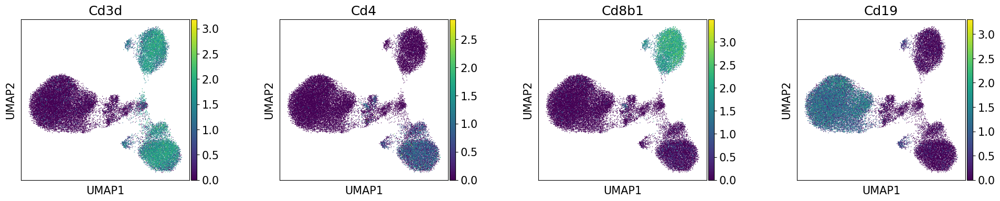

In [11]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.1,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小
sc.pl.umap(adata,color=['Cd3d','Cd4','Cd8b1','Cd19'],wspace=0.4)

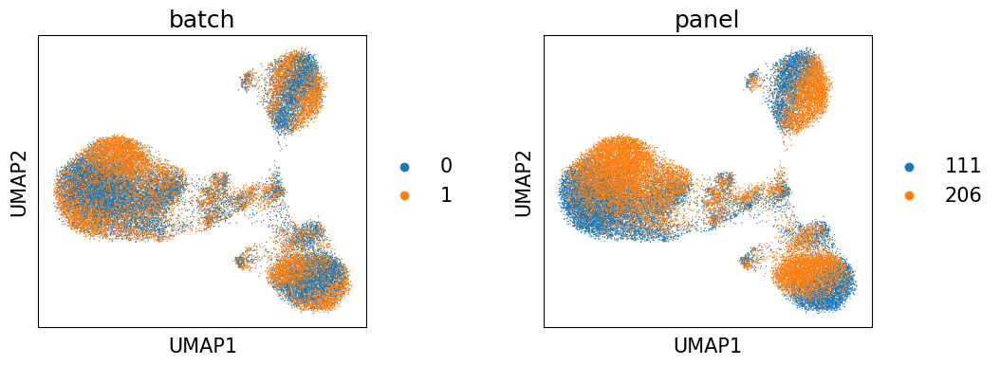

In [12]:
plt.rcParams["figure.figsize"] = (4.1,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小
sc.pl.umap(adata,color=['batch','panel'],wspace=0.4)

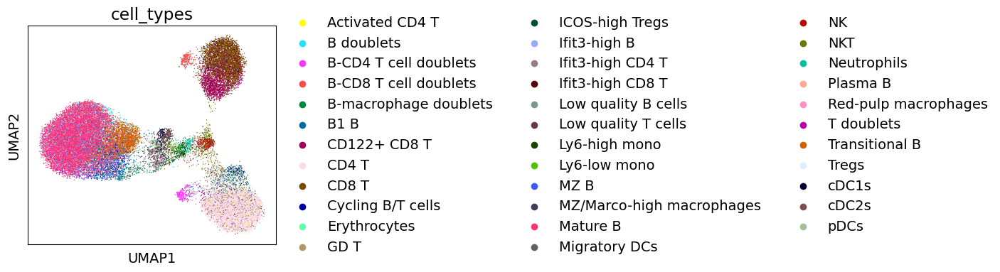

In [14]:
# 设置图的大小
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.5,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小
# sc.pl.umap(adata,color=['clusters_21'],legend_loc='on data')
sc.pl.umap(adata,color=['cell_types'])
# sc.pl.umap(adata,color=['Cd3e','Cd4','Cd8b1','Cd19'],cmap='viridis',frameon=True)

In [15]:
reassign_cluster_names = {
    "Neutrophils": "Neutrophil",
    "Plasma B": "B",
    "Red-pulp macrophages": "Macrophage",
    "T doublets": "doublets",
    "Transitional B": "B",
    "Tregs": "Treg",
    "cDC1s": "DC",
    "cDC2s": "DC",
    "pDCs": "DC",
    "B doublets": "doublets",
    "B-CD4 T cell doublets": "doublets",
    "B-CD8 T cell doublets": "doublets",
    "B-macrophage doublets": "doublets",
    "B1 B": "B",
    "CD122+ CD8 T": "CD8 T",
    "CD4 T": "CD4 T",
    "CD8 T": "CD8 T",
    "Cycling B/T cells": "doublets",
    "Erythrocytes": "Erythrocyte",
    "GD T": "GD T",
    "ICOS-high Tregs": "Treg",
    "Activated CD4 T": "CD4 T",
    "Ifit3-high B": "B",
    "Ifit3-high CD4 T": "CD4 T",
    "Ifit3-high CD8 T": "CD8 T",
    "Low quality B cells": "Low quality B",
    "Low quality T cells": "Low quality T",
    "Ly6-high mono": "Monocyte",
    "Ly6-low mono": "Monocyte",
    "MZ B": "B",
    "MZ/Marco-high macrophages": "Macrophage",
    "Mature B": "B",
    "Migratory DCs": "DC",
    "NK": "NK",
    "NKT": "NKT",
}
adata.obs['Lcelltype'] = adata.obs['cell_types'].map(reassign_cluster_names).astype('category')

In [16]:
adata.obs['Lcelltype'] = adata.obs['Lcelltype'].cat.reorder_categories(['B', 'CD4 T','Treg','GD T', 'CD8 T','NKT','NK', 
                                                                         'Low quality B','Low quality T',
                                                                         'Monocyte','Macrophage','DC','Neutrophil', 
                                                                         'Erythrocyte','doublets'])

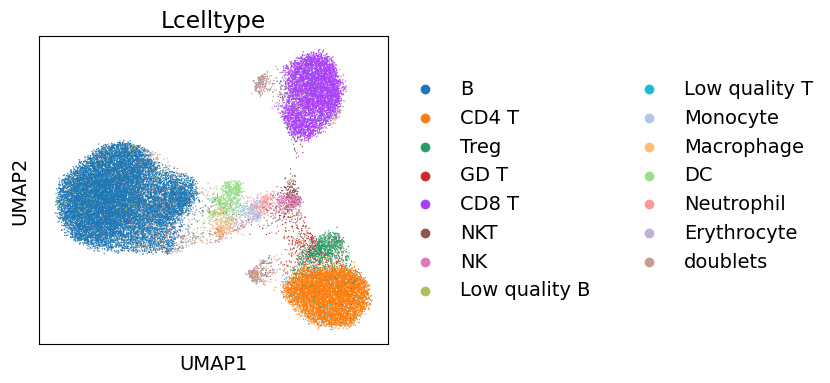

In [17]:
sc.pl.umap(adata,color=['Lcelltype'])

In [18]:
adata.write('./SLN_mergeAll_111_206_GCAT_intersect_wholeGenes.h5ad')

##### evaluation

In [19]:
# leiden: resolution=1
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(adata.obsm['X_GCAT'], adata.obs['leiden_GCAT'])
print("The average silhouette_score is :", silhouette_avg)

silhouette_avg = silhouette_score(adata.obsm['X_umap'], adata.obs['leiden_GCAT'])
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.10725571
The average silhouette_score is : 0.35753307


### protein union

#### leiden

##### load constructed RNA matrix

In [ ]:
datapath = '/data2/wangxf/jupyter_notebook/SpatialTranscriptome/wuxc/GraphCrossATTN/'

In [ ]:
exp = np.load(datapath + 'GraphCrossRNArecon_hvg_SLN_scCITE.npy')
exp.shape

(32648, 4000)

In [ ]:
import anndata as ad
adata = ad.AnnData(X=exp)#, obs=obs_info, var=var_info

In [ ]:
embedding = np.load(datapath + 'GraphCrossEmbedding_hvg_SLN_scCITE.npy')
# embedding

In [ ]:
metadata = pd.read_csv('./SLN_mergedAll_metaData.csv',index_col=0)
metadata.head(2)

,n_protein_counts,n_proteins,seurat_hash_id,batch_indices,hash_id,n_genes,percent_mito,leiden_subclusters,cell_types,n_counts,panel,batch
index,,,,,,,,,,,,
p111_AAACCCAAGGGTAATT-1,2319.0,100,Spleen,0,Spleen,3137,0.062138,"12,0",NKT,9836.0,111,0
p111_AAACCCAAGGTAAACT-1,3760.0,105,Spleen,0,Spleen,2256,0.057545,6,CD122+ CD8 T,7453.0,111,0


In [ ]:
adata.obs = metadata
adata.obsm['X_GCAT'] = embedding
# adata.obsm['X_umap'] = embedding_umap
# adata.obs['clusters'+'_'+str(n_clusters)] = labels

In [ ]:
HVGnames = pd.read_csv('../GraphCrossATTN/scCITE_hvg.csv').iloc[:,0]
# HVGnames
adata.var_names = HVGnames
adata.obs_names = metadata.index

In [ ]:
adata

AnnData object with n_obs × n_vars = 32648 × 4000
    obs: 'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch'
    obsm: 'X_GCAT'

In [ ]:
adata.obs['panel']=adata.obs['panel'].astype('category')
adata.obs['batch_indices']=adata.obs['batch_indices'].astype('category')
adata.obs['batch']=adata.obs['batch'].astype('category')
# adata.obs['clusters_21']=adata.obs['clusters_21'].astype('category')

In [ ]:
sc.pp.neighbors(adata, use_rep='X_GCAT')
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added='leiden_GCAT')

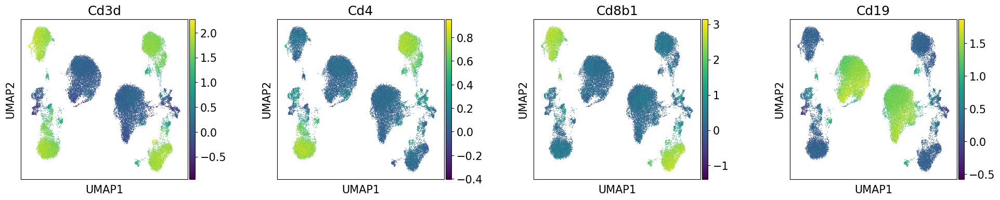

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.1,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小
# sc.pl.umap(adata,color=['1364','1007','225','1956'],wspace=0.4)
sc.pl.umap(adata,color=['Cd3d','Cd4','Cd8b1','Cd19'],wspace=0.4)

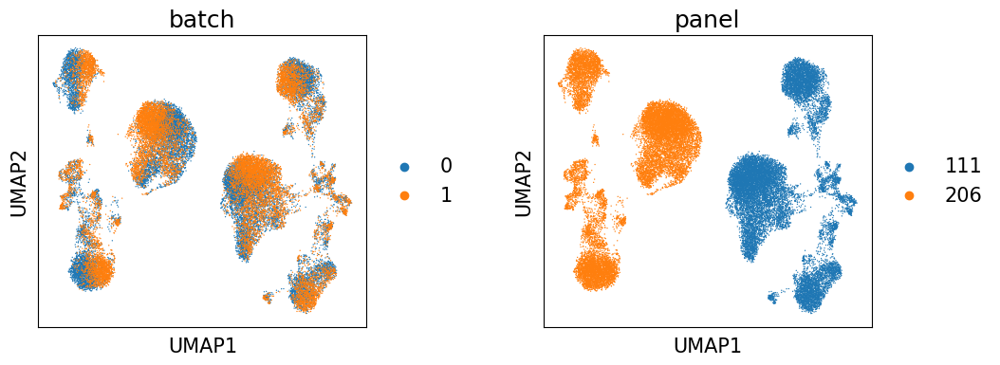

In [ ]:
plt.rcParams["figure.figsize"] = (4.1,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小
sc.pl.umap(adata,color=['batch','panel'],wspace=0.4)

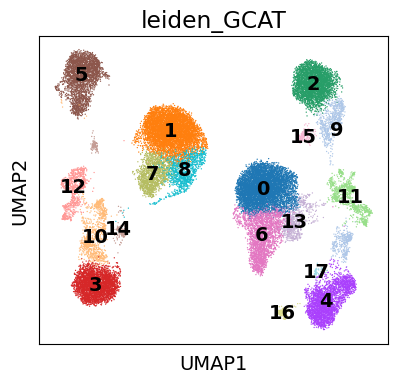

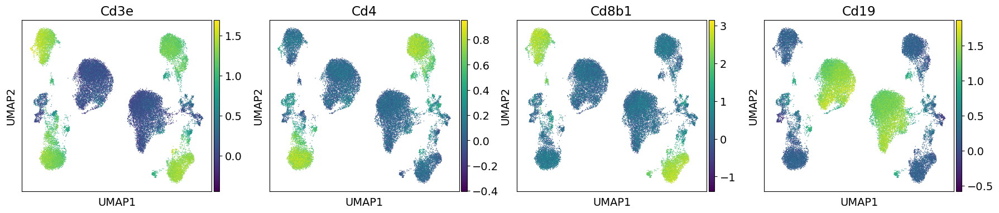

In [ ]:
# 设置图的大小
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.5,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小
sc.pl.umap(adata,color=['leiden_GCAT'],legend_loc='on data')
sc.pl.umap(adata,color=['Cd3e','Cd4','Cd8b1','Cd19'],cmap='viridis',frameon=True)

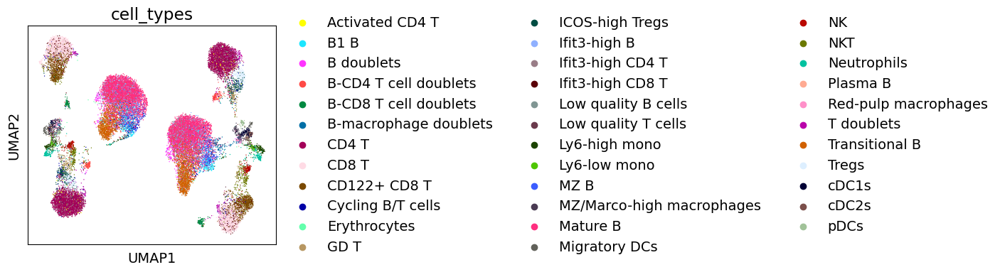

In [ ]:
# 设置图的大小
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.5,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小
# sc.pl.umap(adata,color=['clusters_21'],legend_loc='on data')
sc.pl.umap(adata,color=['cell_types'])
# sc.pl.umap(adata,color=['Cd3e','Cd4','Cd8b1','Cd19'],cmap='viridis',frameon=True)

In [ ]:
reassign_cluster_names = {
    "Neutrophils": "Neutrophil",
    "Plasma B": "B",
    "Red-pulp macrophages": "Macrophage",
    "T doublets": "doublets",
    "Transitional B": "B",
    "Tregs": "Treg",
    "cDC1s": "DC",
    "cDC2s": "DC",
    "pDCs": "DC",
    "B doublets": "doublets",
    "B-CD4 T cell doublets": "doublets",
    "B-CD8 T cell doublets": "doublets",
    "B-macrophage doublets": "doublets",
    "B1 B": "B",
    "CD122+ CD8 T": "CD8 T",
    "CD4 T": "CD4 T",
    "CD8 T": "CD8 T",
    "Cycling B/T cells": "doublets",
    "Erythrocytes": "Erythrocyte",
    "GD T": "GD T",
    "ICOS-high Tregs": "Treg",
    "Activated CD4 T": "CD4 T",
    "Ifit3-high B": "B",
    "Ifit3-high CD4 T": "CD4 T",
    "Ifit3-high CD8 T": "CD8 T",
    "Low quality B cells": "Low quality B",
    "Low quality T cells": "Low quality T",
    "Ly6-high mono": "Monocyte",
    "Ly6-low mono": "Monocyte",
    "MZ B": "B",
    "MZ/Marco-high macrophages": "Macrophage",
    "Mature B": "B",
    "Migratory DCs": "DC",
    "NK": "NK",
    "NKT": "NKT",
}
adata.obs['Lcelltype'] = adata.obs['cell_types'].map(reassign_cluster_names).astype('category')

adata.obs['Lcelltype'] = adata.obs['Lcelltype'].cat.reorder_categories(['B', 'CD4 T','Treg','GD T', 'CD8 T','NKT','NK', 
                                                                         'Low quality B','Low quality T',
                                                                         'Monocyte','Macrophage','DC','Neutrophil', 
                                                                         'Erythrocyte','doublets'])

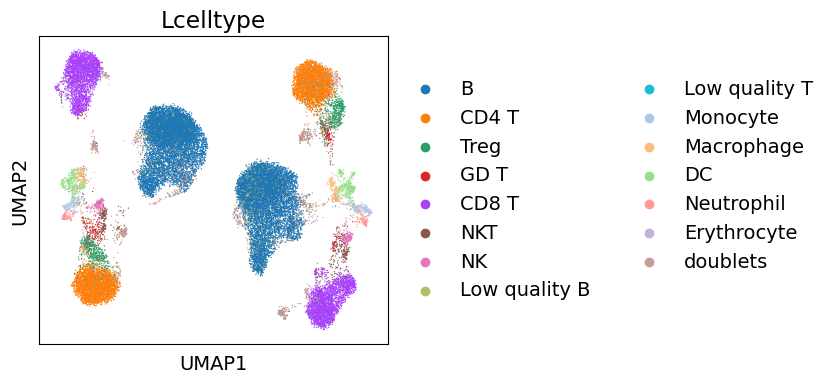

In [ ]:
sc.pl.umap(adata,color=['Lcelltype'])

In [ ]:
adata.write('./SLN_mergeAll_111_206_GCAT_union.h5ad')

##### evaluation

In [ ]:
# leiden: resolution=1
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(adata.obsm['X_GCAT'], adata.obs['leiden_GCAT'])
print("The average silhouette_score is :", silhouette_avg)

silhouette_avg = silhouette_score(adata.obsm['X_umap'], adata.obs['leiden_GCAT'])
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.2499251
The average silhouette_score is : 0.4354689


## GraphCrossATTN - hvg

### protein intersect

#### leiden

##### load constructed RNA matrix

In [2]:
datapath = '/data2/wangxf/jupyter_notebook/SpatialTranscriptome/wuxc/GraphCrossATTN/'

In [3]:
exp = np.load(datapath + 'GraphCrossRNArecon_intersect_hvg_SLN_scCITE.npy')
exp.shape

(32648, 3999)

In [4]:
import anndata as ad
adata = ad.AnnData(X=exp)#, obs=obs_info, var=var_info

In [6]:
embedding = np.load(datapath + 'GraphCrossEmbedding_intersect_hvg_SLN_scCITE.npy')
# embedding

In [7]:
metadata = pd.read_csv('./SLN_mergedAll_metaData.csv',index_col=0)
metadata.head(2)

,n_protein_counts,n_proteins,seurat_hash_id,batch_indices,hash_id,n_genes,percent_mito,leiden_subclusters,cell_types,n_counts,panel,batch
index,,,,,,,,,,,,
p111_AAACCCAAGGGTAATT-1,2319.0,100,Spleen,0,Spleen,3137,0.062138,"12,0",NKT,9836.0,111,0
p111_AAACCCAAGGTAAACT-1,3760.0,105,Spleen,0,Spleen,2256,0.057545,6,CD122+ CD8 T,7453.0,111,0


In [8]:
adata.obs = metadata
adata.obsm['X_GCAT'] = embedding
# adata.obsm['X_umap'] = embedding_umap
# adata.obs['clusters'+'_'+str(n_clusters)] = labels

In [14]:
HVGnames = pd.read_csv('../GraphCrossATTN/scCITE_hvg.csv').iloc[:,0]
# HVGnames
adata.var_names = HVGnames[0:3999]
adata.obs_names = metadata.index

In [13]:
adata

AnnData object with n_obs × n_vars = 32648 × 3999
    obs: 'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', 'leiden_GCAT'
    uns: 'neighbors', 'umap', 'leiden'
    obsm: 'X_GCAT', 'X_umap'
    obsp: 'distances', 'connectivities'

In [16]:
adata.obs['panel']=adata.obs['panel'].astype('category')
adata.obs['batch_indices']=adata.obs['batch_indices'].astype('category')
adata.obs['batch']=adata.obs['batch'].astype('category')
# adata.obs['clusters_21']=adata.obs['clusters_21'].astype('category')

In [10]:
sc.pp.neighbors(adata, use_rep='X_GCAT')
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added='leiden_GCAT')

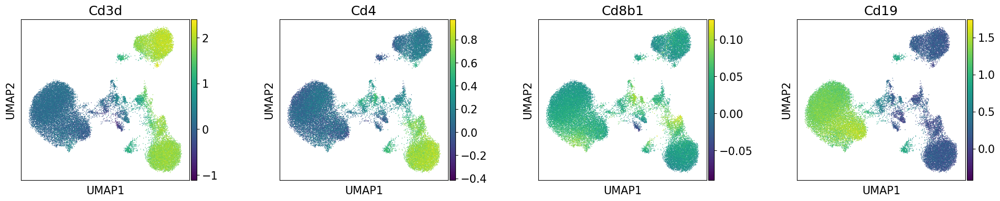

In [18]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.1,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小
# sc.pl.umap(adata,color=['1364','1007','225','1956'],wspace=0.4)
sc.pl.umap(adata,color=['Cd3d','Cd4','Cd8b1','Cd19'],wspace=0.4)

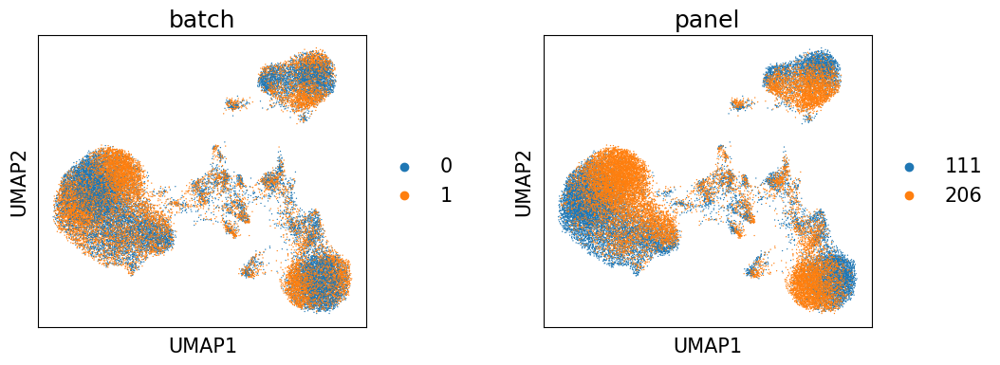

In [19]:
plt.rcParams["figure.figsize"] = (4.1,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小
sc.pl.umap(adata,color=['batch','panel'],wspace=0.4)

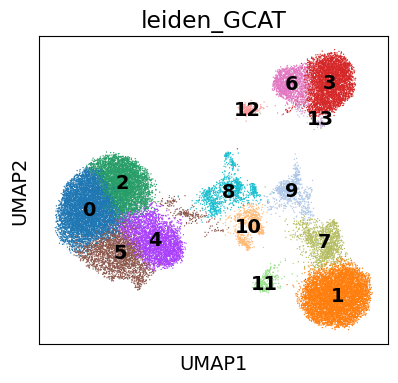

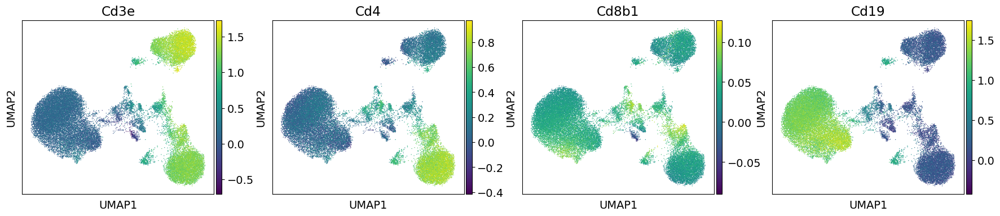

In [21]:
# 设置图的大小
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.5,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小
sc.pl.umap(adata,color=['leiden_GCAT'],legend_loc='on data')
sc.pl.umap(adata,color=['Cd3e','Cd4','Cd8b1','Cd19'],cmap='viridis',frameon=True)

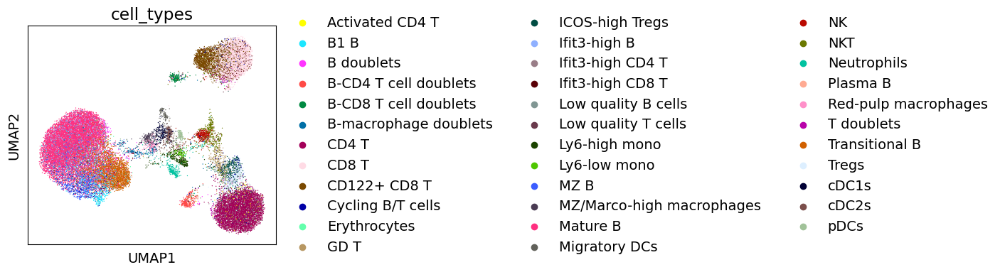

In [22]:
# 设置图的大小
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.5,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小
# sc.pl.umap(adata,color=['clusters_21'],legend_loc='on data')
sc.pl.umap(adata,color=['cell_types'])
# sc.pl.umap(adata,color=['Cd3e','Cd4','Cd8b1','Cd19'],cmap='viridis',frameon=True)

In [23]:
reassign_cluster_names = {
    "Neutrophils": "Neutrophil",
    "Plasma B": "B",
    "Red-pulp macrophages": "Macrophage",
    "T doublets": "doublets",
    "Transitional B": "B",
    "Tregs": "Treg",
    "cDC1s": "DC",
    "cDC2s": "DC",
    "pDCs": "DC",
    "B doublets": "doublets",
    "B-CD4 T cell doublets": "doublets",
    "B-CD8 T cell doublets": "doublets",
    "B-macrophage doublets": "doublets",
    "B1 B": "B",
    "CD122+ CD8 T": "CD8 T",
    "CD4 T": "CD4 T",
    "CD8 T": "CD8 T",
    "Cycling B/T cells": "doublets",
    "Erythrocytes": "Erythrocyte",
    "GD T": "GD T",
    "ICOS-high Tregs": "Treg",
    "Activated CD4 T": "CD4 T",
    "Ifit3-high B": "B",
    "Ifit3-high CD4 T": "CD4 T",
    "Ifit3-high CD8 T": "CD8 T",
    "Low quality B cells": "Low quality B",
    "Low quality T cells": "Low quality T",
    "Ly6-high mono": "Monocyte",
    "Ly6-low mono": "Monocyte",
    "MZ B": "B",
    "MZ/Marco-high macrophages": "Macrophage",
    "Mature B": "B",
    "Migratory DCs": "DC",
    "NK": "NK",
    "NKT": "NKT",
}
adata.obs['Lcelltype'] = adata.obs['cell_types'].map(reassign_cluster_names).astype('category')

In [25]:
adata.obs['Lcelltype'] = adata.obs['Lcelltype'].cat.reorder_categories(['B', 'CD4 T','Treg','GD T', 'CD8 T','NKT','NK', 
                                                                         'Low quality B','Low quality T',
                                                                         'Monocyte','Macrophage','DC','Neutrophil', 
                                                                         'Erythrocyte','doublets'])

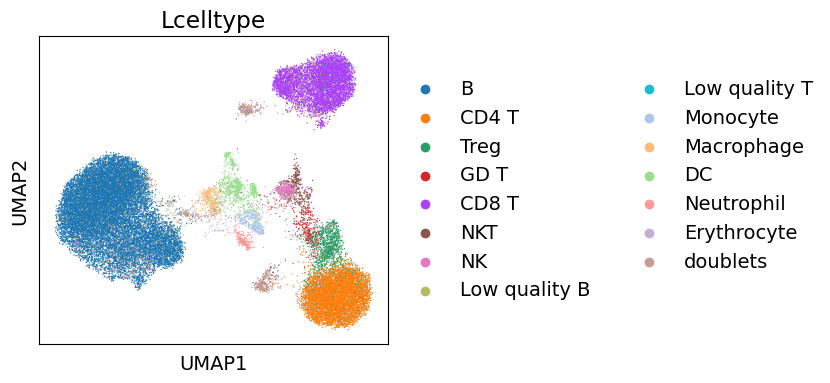

In [26]:
sc.pl.umap(adata,color=['Lcelltype'])

In [27]:
adata.write('./SLN_mergeAll_111_206_GCAT_intersect.h5ad')

In [4]:
adata = sc.read('./SLN_mergeAll_111_206_GCAT_intersect.h5ad')
adata

AnnData object with n_obs × n_vars = 32648 × 3999
    obs: 'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', 'leiden_GCAT', 'Lcelltype'
    uns: 'Lcelltype_colors', 'batch_colors', 'cell_types_colors', 'leiden', 'leiden_GCAT_colors', 'neighbors', 'panel_colors', 'umap'
    obsm: 'X_GCAT', 'X_umap'
    obsp: 'connectivities', 'distances'

/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


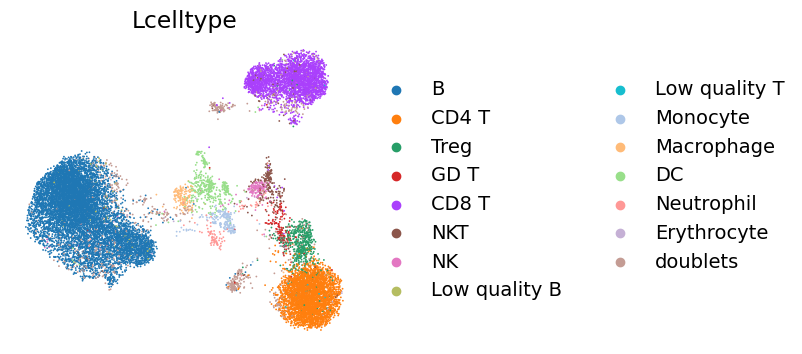

In [13]:
# 设置图的大小
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.5,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小
sc.pl.umap(adata[adata.obs['batch_indices'].isin([0],)],color=['Lcelltype'],frameon=False)

##### evaluation

In [28]:
# leiden: resolution=1
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(adata.obsm['X_GCAT'], adata.obs['leiden_GCAT'])
print("The average silhouette_score is :", silhouette_avg)

silhouette_avg = silhouette_score(adata.obsm['X_umap'], adata.obs['leiden_GCAT'])
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.114499636
The average silhouette_score is : 0.38744897


### protein union

#### leiden

##### load constructed RNA matrix

In [42]:
datapath = '/data2/wangxf/jupyter_notebook/SpatialTranscriptome/wuxc/GraphCrossATTN/'

In [43]:
exp = np.load(datapath + 'GraphCrossRNArecon_hvg_SLN_scCITE.npy')
exp.shape

(32648, 4000)

In [44]:
import anndata as ad
adata = ad.AnnData(X=exp)#, obs=obs_info, var=var_info

In [45]:
embedding = np.load(datapath + 'GraphCrossEmbedding_hvg_SLN_scCITE.npy')
# embedding

In [46]:
metadata = pd.read_csv('./SLN_mergedAll_metaData.csv',index_col=0)
metadata.head(2)

,n_protein_counts,n_proteins,seurat_hash_id,batch_indices,hash_id,n_genes,percent_mito,leiden_subclusters,cell_types,n_counts,panel,batch
index,,,,,,,,,,,,
p111_AAACCCAAGGGTAATT-1,2319.0,100,Spleen,0,Spleen,3137,0.062138,"12,0",NKT,9836.0,111,0
p111_AAACCCAAGGTAAACT-1,3760.0,105,Spleen,0,Spleen,2256,0.057545,6,CD122+ CD8 T,7453.0,111,0


In [47]:
adata.obs = metadata
adata.obsm['X_GCAT'] = embedding
# adata.obsm['X_umap'] = embedding_umap
# adata.obs['clusters'+'_'+str(n_clusters)] = labels

In [48]:
HVGnames = pd.read_csv('../GraphCrossATTN/scCITE_hvg.csv').iloc[:,0]
# HVGnames
adata.var_names = HVGnames
adata.obs_names = metadata.index

In [49]:
adata

AnnData object with n_obs × n_vars = 32648 × 4000
    obs: 'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch'
    obsm: 'X_GCAT'

In [50]:
adata.obs['panel']=adata.obs['panel'].astype('category')
adata.obs['batch_indices']=adata.obs['batch_indices'].astype('category')
adata.obs['batch']=adata.obs['batch'].astype('category')
# adata.obs['clusters_21']=adata.obs['clusters_21'].astype('category')

In [51]:
sc.pp.neighbors(adata, use_rep='X_GCAT')
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added='leiden_GCAT')

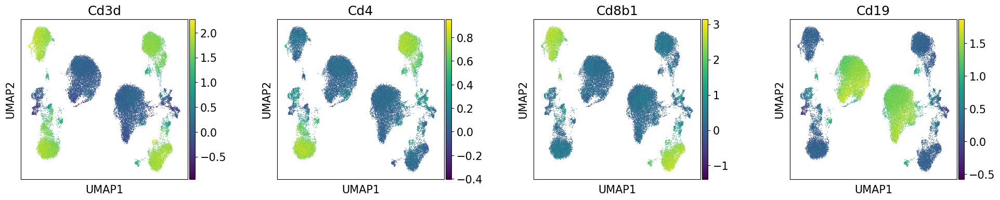

In [52]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.1,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小
# sc.pl.umap(adata,color=['1364','1007','225','1956'],wspace=0.4)
sc.pl.umap(adata,color=['Cd3d','Cd4','Cd8b1','Cd19'],wspace=0.4)

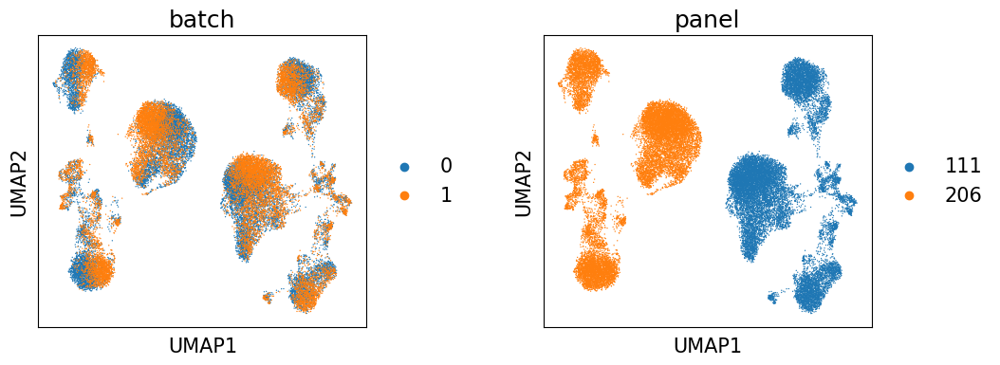

In [53]:
plt.rcParams["figure.figsize"] = (4.1,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小
sc.pl.umap(adata,color=['batch','panel'],wspace=0.4)

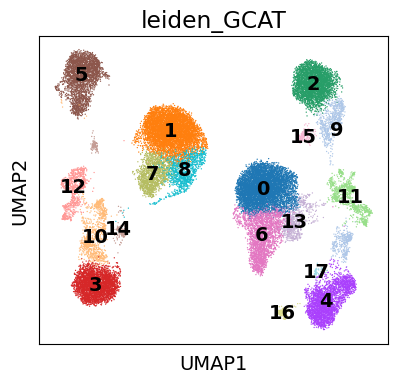

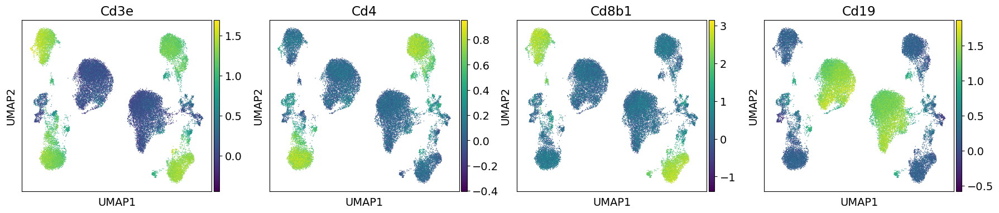

In [54]:
# 设置图的大小
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.5,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小
sc.pl.umap(adata,color=['leiden_GCAT'],legend_loc='on data')
sc.pl.umap(adata,color=['Cd3e','Cd4','Cd8b1','Cd19'],cmap='viridis',frameon=True)

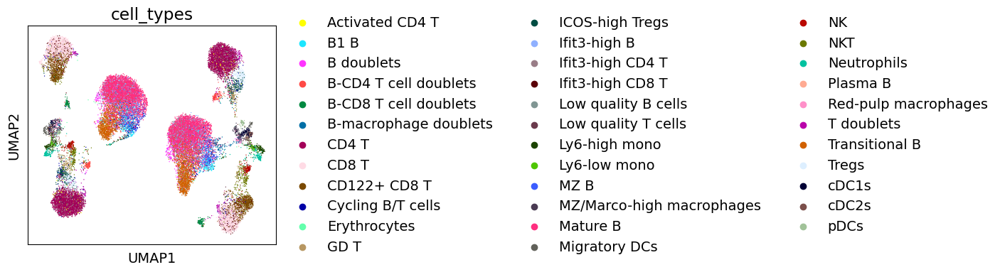

In [55]:
# 设置图的大小
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.5,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小
# sc.pl.umap(adata,color=['clusters_21'],legend_loc='on data')
sc.pl.umap(adata,color=['cell_types'])
# sc.pl.umap(adata,color=['Cd3e','Cd4','Cd8b1','Cd19'],cmap='viridis',frameon=True)

In [56]:
reassign_cluster_names = {
    "Neutrophils": "Neutrophil",
    "Plasma B": "B",
    "Red-pulp macrophages": "Macrophage",
    "T doublets": "doublets",
    "Transitional B": "B",
    "Tregs": "Treg",
    "cDC1s": "DC",
    "cDC2s": "DC",
    "pDCs": "DC",
    "B doublets": "doublets",
    "B-CD4 T cell doublets": "doublets",
    "B-CD8 T cell doublets": "doublets",
    "B-macrophage doublets": "doublets",
    "B1 B": "B",
    "CD122+ CD8 T": "CD8 T",
    "CD4 T": "CD4 T",
    "CD8 T": "CD8 T",
    "Cycling B/T cells": "doublets",
    "Erythrocytes": "Erythrocyte",
    "GD T": "GD T",
    "ICOS-high Tregs": "Treg",
    "Activated CD4 T": "CD4 T",
    "Ifit3-high B": "B",
    "Ifit3-high CD4 T": "CD4 T",
    "Ifit3-high CD8 T": "CD8 T",
    "Low quality B cells": "Low quality B",
    "Low quality T cells": "Low quality T",
    "Ly6-high mono": "Monocyte",
    "Ly6-low mono": "Monocyte",
    "MZ B": "B",
    "MZ/Marco-high macrophages": "Macrophage",
    "Mature B": "B",
    "Migratory DCs": "DC",
    "NK": "NK",
    "NKT": "NKT",
}
adata.obs['Lcelltype'] = adata.obs['cell_types'].map(reassign_cluster_names).astype('category')

adata.obs['Lcelltype'] = adata.obs['Lcelltype'].cat.reorder_categories(['B', 'CD4 T','Treg','GD T', 'CD8 T','NKT','NK', 
                                                                         'Low quality B','Low quality T',
                                                                         'Monocyte','Macrophage','DC','Neutrophil', 
                                                                         'Erythrocyte','doublets'])

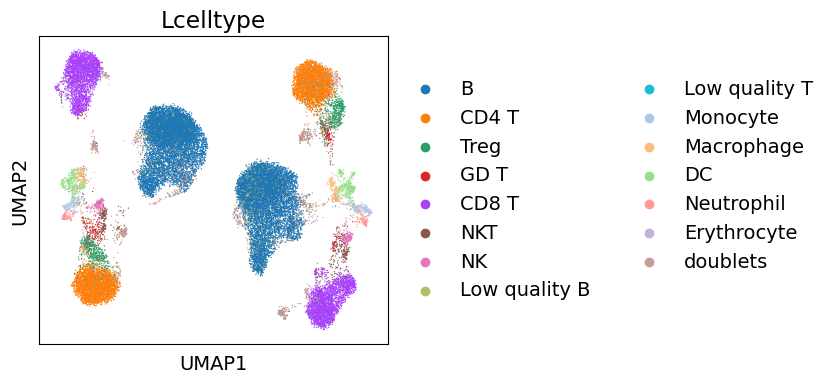

In [58]:
sc.pl.umap(adata,color=['Lcelltype'])

In [59]:
adata.write('./SLN_mergeAll_111_206_GCAT_union.h5ad')

##### evaluation

In [60]:
# leiden: resolution=1
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(adata.obsm['X_GCAT'], adata.obs['leiden_GCAT'])
print("The average silhouette_score is :", silhouette_avg)

silhouette_avg = silhouette_score(adata.obsm['X_umap'], adata.obs['leiden_GCAT'])
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.2499251
The average silhouette_score is : 0.4354689


# k-mean / leiden

In [24]:
def measurement_mixing_metric(measurements, labels):
    """
    Calculate the measurement mixing metric for the integration results.

    Parameters:
    - measurements: A 2D array where each row represents the measurements of a sample.
    - labels: An array of labels indicating the group of each sample.

    Returns:
    - metric: A scalar value representing the mixing metric.
    """
    from scipy.stats import ks_2samp
    # Example: Use the Kolmogorov-Smirnov statistic as a metric
    unique_labels = np.unique(labels)
    ks_stats = []
    for i in range(len(unique_labels)):
        for j in range(i + 1, len(unique_labels)):
            group_i = measurements[labels == unique_labels[i]]
            group_j = measurements[labels == unique_labels[j]]
            ks_stat, _ = ks_2samp(group_i.ravel(), group_j.ravel())
            ks_stats.append(ks_stat)
    metric = np.mean(ks_stats)
    return metric

## GCAT

### Union protein

In [84]:
adata = sc.read('./SLN_mergeAll_111_206_GCAT_union.h5ad')
adata

AnnData object with n_obs × n_vars = 32648 × 4000
    obs: 'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', 'leiden_GCAT', 'Lcelltype'
    uns: 'Lcelltype_colors', 'batch_colors', 'cell_types_colors', 'leiden', 'leiden_GCAT_colors', 'neighbors', 'panel_colors', 'umap'
    obsm: 'X_GCAT', 'X_umap'
    obsp: 'connectivities', 'distances'

In [85]:
## ------ leiden mixing metric -------

embedding = adata.obsm['X_GCAT']
labels = adata.obs['leiden_GCAT']
embedding.shape

umap = UMAP(n_neighbors=15, n_components=2, random_state=42)
embedding_umap = umap.fit_transform(embedding)

#Calculate the measurement mixing metric for the integration results.
metric = measurement_mixing_metric(embedding, labels)
print("The mixing metric is :", metric)

metric = measurement_mixing_metric(embedding_umap, labels)
print("The mixing metric is :", metric)

/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


The mixing metric is : 0.054916090847694894
The mixing metric is : 0.6281556972451798


In [33]:
## -- K-mean mixing metric ----

# embedding = np.load('/data2/wangxf/jupyter_notebook/SpatialTranscriptome/wuxc/GraphCrossATTN/GraphCrossEmbedding_hvg_SLN_scCITE.npy')
embedding = adata.obsm['X_GCAT']
embedding.shape

umap = UMAP(n_neighbors=15, n_components=2, random_state=42)
embedding_umap = umap.fit_transform(embedding)

n_clusters = 21  # 假设你想将数据聚类成3个群
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(embedding)

#Calculate the measurement mixing metric for the integration results.
metric = measurement_mixing_metric(embedding, labels)
print("The mixing metric is :", metric)

metric = measurement_mixing_metric(embedding_umap, labels)
print("The mixing metric is :", metric)


The mixing metric is : 0.0565329333181729
The mixing metric is : 0.62088838133264


In [6]:
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(embedding, labels)
print("The average silhouette_score is :", silhouette_avg)

silhouette_avg = silhouette_score(embedding_umap, labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.19205584
The average silhouette_score is : 0.45715812


Text(0, 0.5, 'UMAP 2')

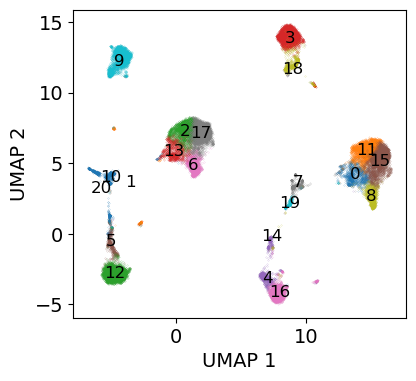

In [10]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小

unique_labels = np.unique(labels)
# label_counts = pd.Series(labels).value_counts()
# label_ranks = label_counts.rank(method='min', ascending=False).astype(int)
# ranked_labels = [f'{label_ranks[label]}' for label in labels]

for label in unique_labels:
    # Filter points belonging to the current label
    points = embedding_umap[labels == label]
    
    # Plot points with a larger size
    plt.scatter(points[:, 0], points[:, 1], label=label, s=0.01)  # Adjust the size with the 's' parameter
    
    # Calculate the centroid of the points and annotate with the label
    centroid = np.mean(points, axis=0)
    plt.text(centroid[0], centroid[1], label, fontsize=12, ha='center', va='center')

# plt.scatter(embedding_umap[:, 0], embedding_umap[:,1], c=labels)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')

### intersect protein

#### hvg

In [86]:
adata = sc.read('./SLN_mergeAll_111_206_GCAT_intersect.h5ad')
adata

AnnData object with n_obs × n_vars = 32648 × 3999
    obs: 'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', 'leiden_GCAT', 'Lcelltype'
    uns: 'Lcelltype_colors', 'batch_colors', 'cell_types_colors', 'leiden', 'leiden_GCAT_colors', 'neighbors', 'panel_colors', 'umap'
    obsm: 'X_GCAT', 'X_umap'
    obsp: 'connectivities', 'distances'

In [87]:
## ----- leiden mixing metric -----

embedding = adata.obsm['X_GCAT']
labels = adata.obs['leiden_GCAT']
embedding.shape

umap = UMAP(n_neighbors=15, n_components=2, random_state=42)
embedding_umap = umap.fit_transform(embedding)

#Calculate the measurement mixing metric for the integration results.
metric = measurement_mixing_metric(embedding, labels)
print("The mixing metric is :", metric)

metric = measurement_mixing_metric(embedding_umap, labels)
print("The mixing metric is :", metric)

/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


The mixing metric is : 0.07441155736095877
The mixing metric is : 0.6483711153903998


In [36]:
## ------ k-mean mixing metric ---------

umap = UMAP(n_neighbors=15, n_components=2, random_state=42)
embedding_umap = umap.fit_transform(embedding)

n_clusters = 21  # 假设你想将数据聚类成3个群
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(embedding)

#Calculate the measurement mixing metric for the integration results.
metric = measurement_mixing_metric(embedding, labels)
print("The mixing metric is :", metric)

metric = measurement_mixing_metric(embedding_umap, labels)
print("The mixing metric is :", metric)

The mixing metric is : 0.07133434492956886
The mixing metric is : 0.5941319090890631


In [13]:
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(embedding, labels)
print("The average silhouette_score is :", silhouette_avg)

silhouette_avg = silhouette_score(embedding_umap, labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.07310103
The average silhouette_score is : 0.2359525


Text(0, 0.5, 'UMAP 2')

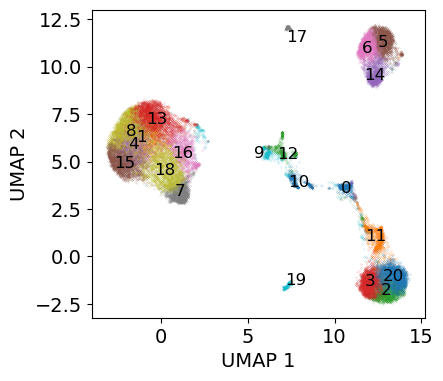

In [14]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小

unique_labels = np.unique(labels)
# label_counts = pd.Series(labels).value_counts()
# label_ranks = label_counts.rank(method='min', ascending=False).astype(int)
# ranked_labels = [f'{label_ranks[label]}' for label in labels]

for label in unique_labels:
    # Filter points belonging to the current label
    points = embedding_umap[labels == label]
    
    # Plot points with a larger size
    plt.scatter(points[:, 0], points[:, 1], label=label, s=0.01)  # Adjust the size with the 's' parameter
    
    # Calculate the centroid of the points and annotate with the label
    centroid = np.mean(points, axis=0)
    plt.text(centroid[0], centroid[1], label, fontsize=12, ha='center', va='center')

# plt.scatter(embedding_umap[:, 0], embedding_umap[:,1], c=labels)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')

#### wholegenes

In [95]:
import scanpy as sc
adata = sc.read_h5ad('./SLN_mergeAll_111_206_GCAT_intersect_wholeGenes.h5ad')
adata

AnnData object with n_obs × n_vars = 32648 × 13553
    obs: 'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', 'leiden_GCAT', 'Lcelltype'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'Lcelltype_colors', 'batch_colors', 'cell_types_colors', 'hvg', 'leiden', 'leiden_GCAT_colors', 'log1p', 'neighbors', 'panel_colors', 'umap'
    obsm: 'X_GCAT', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [100]:
## ----- leiden mixing metric -----

embedding = adata.obsm['X_GCAT']
labels = adata.obs['leiden_GCAT']
embedding.shape

umap = UMAP(n_neighbors=15, n_components=2, random_state=42)
embedding_umap = umap.fit_transform(embedding)

#Calculate the measurement mixing metric for the integration results.
metric = measurement_mixing_metric(embedding, labels)
print("embedding - The mixing metric is :", metric)

metric = measurement_mixing_metric(embedding_umap, labels)
print("embedding_umap - The mixing metric is :", metric)


##calculate silhouette score
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(embedding, labels)
print("embedding - The average silhouette_score is :", silhouette_avg)

silhouette_avg = silhouette_score(embedding_umap, labels)
print("embedding_umap - The average silhouette_score is :", silhouette_avg)

/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


The mixing metric is : 0.052761582356710204
The mixing metric is : 0.6159388416049937
embedding - The average silhouette_score is : 0.10725571
embedding_umap - The average silhouette_score is : 0.4385146


In [97]:
## ------ k-mean mixing metric ---------

umap = UMAP(n_neighbors=15, n_components=2, random_state=42)
embedding_umap = umap.fit_transform(embedding)

n_clusters = 21  # 假设你想将数据聚类成3个群
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(embedding)

#Calculate the measurement mixing metric for the integration results.
metric = measurement_mixing_metric(embedding, labels)
print("embedding - The mixing metric is :", metric)

metric = measurement_mixing_metric(embedding_umap, labels)
print("embedding_umap - The mixing metric is :", metric)

##calculate silhouette score
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(embedding, labels)
print("embedding - The average silhouette_score is :", silhouette_avg)

silhouette_avg = silhouette_score(embedding_umap, labels)
print("embedding_umap - The average silhouette_score is :", silhouette_avg)

/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


The mixing metric is : 0.0638546648612714
The mixing metric is : 0.559618314292235


Text(0, 0.5, 'UMAP 2')

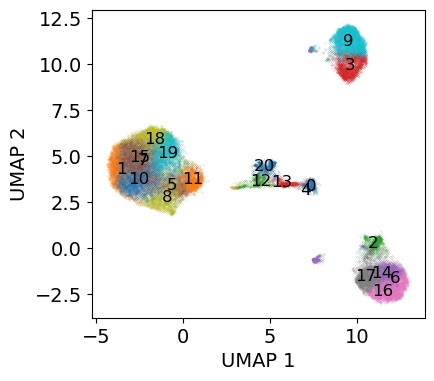

In [99]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小

unique_labels = np.unique(labels)
# label_counts = pd.Series(labels).value_counts()
# label_ranks = label_counts.rank(method='min', ascending=False).astype(int)
# ranked_labels = [f'{label_ranks[label]}' for label in labels]

for label in unique_labels:
    # Filter points belonging to the current label
    points = embedding_umap[labels == label]
    
    # Plot points with a larger size
    plt.scatter(points[:, 0], points[:, 1], label=label, s=0.01)  # Adjust the size with the 's' parameter
    
    # Calculate the centroid of the points and annotate with the label
    centroid = np.mean(points, axis=0)
    plt.text(centroid[0], centroid[1], label, fontsize=12, ha='center', va='center')

# plt.scatter(embedding_umap[:, 0], embedding_umap[:,1], c=labels)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')

## MOFA+

### Union protein

In [75]:
import pandas as pd
import scanpy as sc
adata = sc.read_h5ad('./SLN_mergeAll_111_206_MOFA_union.h5ad')
adata
# embedding = pd.read_csv('./SLN_mergeAll_111_206_MOFA_embedding_outer.csv',index_col=0)
# print(embedding.iloc[1:3,1:3])
# embedding.shape

AnnData object with n_obs × n_vars = 32648 × 13553
    obs: 'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', 'leiden_MOFA', 'Lcelltype'
    uns: 'Lcelltype_colors', 'batch_colors', 'cell_types_colors', 'leiden', 'leiden_MOFA_colors', 'neighbors', 'panel_colors', 'umap'
    obsm: 'X_MOFA', 'X_umap'
    obsp: 'connectivities', 'distances'

In [76]:
## ----- leiden mixing metric -----

embedding = adata.obsm['X_MOFA']
labels = adata.obs['leiden_MOFA']
embedding.shape

umap = UMAP(n_neighbors=15, n_components=2, random_state=42)
embedding_umap = umap.fit_transform(embedding)

#Calculate the measurement mixing metric for the integration results.
metric = measurement_mixing_metric(embedding.values, labels)
print("The mixing metric is :", metric)

metric = measurement_mixing_metric(embedding_umap, labels)
print("The mixing metric is :", metric)

/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


The mixing metric is : 0.14173563399486258
The mixing metric is : 0.6470050141834516


In [46]:
## ------ k-mean mixing metric ---------

embedding = adata.obsm['X_MOFA']
umap = UMAP(n_neighbors=15, n_components=2, random_state=42)
embedding_umap = umap.fit_transform(embedding)

n_clusters = 21  # 假设你想将数据聚类成3个群
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(embedding)

#Calculate the measurement mixing metric for the integration results.
metric = measurement_mixing_metric(embedding.values, labels)
print("The mixing metric is :", metric)

metric = measurement_mixing_metric(embedding_umap, labels)
print("The mixing metric is :", metric)

The mixing metric is : 0.16063940057038933
The mixing metric is : 0.6287077878375393


In [6]:
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(embedding, labels)
print("The average silhouette_score is :", silhouette_avg)

silhouette_avg = silhouette_score(embedding_umap, labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.1395727719570705
The average silhouette_score is : 0.36661994


Text(0, 0.5, 'UMAP 2')

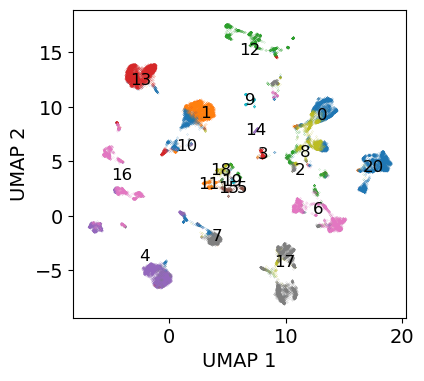

In [7]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小

unique_labels = np.unique(labels)
# label_counts = pd.Series(labels).value_counts()
# label_ranks = label_counts.rank(method='min', ascending=False).astype(int)
# ranked_labels = [f'{label_ranks[label]}' for label in labels]

for label in unique_labels:
    # Filter points belonging to the current label
    points = embedding_umap[labels == label]
    
    # Plot points with a larger size
    plt.scatter(points[:, 0], points[:, 1], label=label, s=0.01)  # Adjust the size with the 's' parameter
    
    # Calculate the centroid of the points and annotate with the label
    centroid = np.mean(points, axis=0)
    plt.text(centroid[0], centroid[1], label, fontsize=12, ha='center', va='center')

# plt.scatter(embedding_umap[:, 0], embedding_umap[:,1], c=labels)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')

### intersect protein

In [47]:
import pandas as pd
import scanpy as sc
adata = sc.read_h5ad('./SLN_mergeAll_111_206_MOFA_intersect.h5ad')
adata
# embedding = pd.read_csv('./SLN_mergeAll_111_206_MOFA_embedding_outer.csv',index_col=0)
# print(embedding.iloc[1:3,1:3])
# embedding.shape

                                 1         2
index                                       
p111_AAACCCAAGGTAAACT-1   9.252685 -4.315112
p111_AAACCCACACTAGGTT-1 -13.783679  7.292022


(32648, 30)

In [74]:
## ----- leiden mixing metric -----

embedding = adata.obsm['X_MOFA']
labels = adata.obs['leiden_MOFA']
embedding.shape

umap = UMAP(n_neighbors=15, n_components=2, random_state=42)
embedding_umap = umap.fit_transform(embedding)

#Calculate the measurement mixing metric for the integration results.
metric = measurement_mixing_metric(embedding.values, labels)
print("The mixing metric is :", metric)

metric = measurement_mixing_metric(embedding_umap, labels)
print("The mixing metric is :", metric)

/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


The mixing metric is : 0.1951000900232252
The mixing metric is : 0.5613845821861682


In [49]:
## ------- k-means mixing metric ---------

embedding = adata.obsm['X_MOFA']

umap = UMAP(n_neighbors=15, n_components=2, random_state=42)
embedding_umap = umap.fit_transform(embedding)

n_clusters = 21  # 假设你想将数据聚类成3个群
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(embedding)

#Calculate the measurement mixing metric for the integration results.
metric = measurement_mixing_metric(embedding.values, labels)
print("The mixing metric is :", metric)

metric = measurement_mixing_metric(embedding_umap, labels)
print("The mixing metric is :", metric)

The mixing metric is : 0.18769020090389343
The mixing metric is : 0.4864349684926166


In [12]:
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(embedding, labels)
print("The average silhouette_score is :", silhouette_avg)

silhouette_avg = silhouette_score(embedding_umap, labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.14921295328402964
The average silhouette_score is : 0.046592306


Text(0, 0.5, 'UMAP 2')

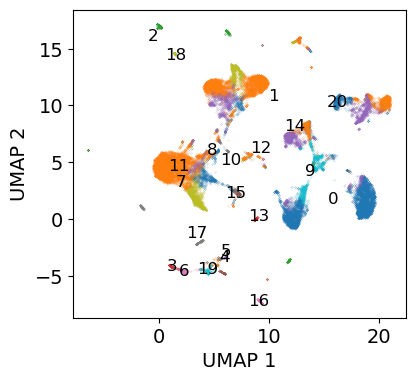

In [13]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小

unique_labels = np.unique(labels)
# label_counts = pd.Series(labels).value_counts()
# label_ranks = label_counts.rank(method='min', ascending=False).astype(int)
# ranked_labels = [f'{label_ranks[label]}' for label in labels]

for label in unique_labels:
    # Filter points belonging to the current label
    points = embedding_umap[labels == label]
    
    # Plot points with a larger size
    plt.scatter(points[:, 0], points[:, 1], label=label, s=0.01)  # Adjust the size with the 's' parameter
    
    # Calculate the centroid of the points and annotate with the label
    centroid = np.mean(points, axis=0)
    plt.text(centroid[0], centroid[1], label, fontsize=12, ha='center', va='center')

# plt.scatter(embedding_umap[:, 0], embedding_umap[:,1], c=labels)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')

## totalVI

### union protein

In [78]:
## inner
import muon as mu
adata_totalVI = mu.read_h5mu('SLM_mergeAll_111_206_totalVI_outer.h5mu')
adata_totalVI

/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/mudata/_core/mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


MuData object with n_obs × n_vars = 32648 × 17760
  obs:	'_scvi_labels'
  uns:	'_scvi_manager_uuid', '_scvi_uuid'
  3 modalities
    rna:	32648 x 13553
      obs:	'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
      uns:	'hvg', 'log1p'
      layers:	'counts'
    protein:	32648 x 207
      obs:	'_scvi_batch'
      var:	'clean_names'
      layers:	'denoised_protein', 'protein_foreground_prob'
    rna_subset:	32648 x 4000
      obs:	'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', '_scvi_batch', 'leiden_totalVI'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
      uns:	'hvg', 'leiden', 'log1p', 'neighbors', 'rna_subset:batch_colors', 'rna_subset:leiden_totalVI_colors', 'rna_subset:panel_colors', 'umap'
      obsm:	'X_totalVI', 'X_umap'
      layers:	'counts', 'denoised_rna'
      obsp:	'connectivities', 'distances'

In [81]:
## ----- leiden mixing metric -----

embedding = adata_totalVI['rna_subset'].obsm['X_totalVI']
labels = adata_totalVI['rna_subset'].obs['leiden_totalVI']
embedding.shape

umap = UMAP(n_neighbors=15, n_components=2, random_state=42)
embedding_umap = umap.fit_transform(embedding)

#Calculate the measurement mixing metric for the integration results.
metric = measurement_mixing_metric(embedding, labels)
print("The mixing metric is :", metric)

metric = measurement_mixing_metric(embedding_umap, labels)
print("The mixing metric is :", metric)

/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


The mixing metric is : 0.13485984603788997
The mixing metric is : 0.5963990138884622


In [57]:
## ------- k-mean mixing metric ------------

embedding = adata_totalVI['rna_subset'].obsm['X_totalVI']
umap = UMAP(n_neighbors=15, n_components=2, random_state=42)
embedding_umap = umap.fit_transform(embedding)

n_clusters = 21  # 假设你想将数据聚类成3个群
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(embedding)

#Calculate the measurement mixing metric for the integration results.
metric = measurement_mixing_metric(embedding, labels)
print("The mixing metric is :", metric)

metric = measurement_mixing_metric(embedding_umap, labels)
print("The mixing metric is :", metric)

The mixing metric is : 0.12909497137620563
The mixing metric is : 0.5464129535867028


In [13]:
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(embedding, labels)
print("The average silhouette_score is :", silhouette_avg)

silhouette_avg = silhouette_score(embedding_umap, labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.10058845
The average silhouette_score is : 0.25717127


Text(0, 0.5, 'UMAP 2')

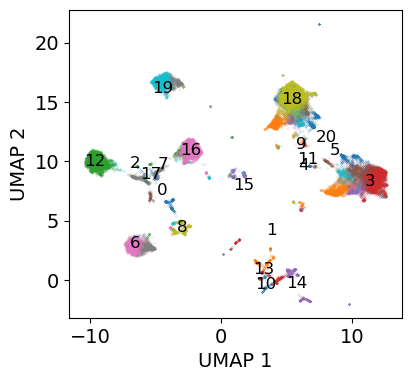

In [14]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小

unique_labels = np.unique(labels)
# label_counts = pd.Series(labels).value_counts()
# label_ranks = label_counts.rank(method='min', ascending=False).astype(int)
# ranked_labels = [f'{label_ranks[label]}' for label in labels]

for label in unique_labels:
    # Filter points belonging to the current label
    points = embedding_umap[labels == label]
    
    # Plot points with a larger size
    plt.scatter(points[:, 0], points[:, 1], label=label, s=0.01)  # Adjust the size with the 's' parameter
    
    # Calculate the centroid of the points and annotate with the label
    centroid = np.mean(points, axis=0)
    plt.text(centroid[0], centroid[1], label, fontsize=12, ha='center', va='center')

# plt.scatter(embedding_umap[:, 0], embedding_umap[:,1], c=labels)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')

### intersect protein

In [82]:
## inner
import muon as mu
adata_totalVI = mu.read_h5mu('SLM_mergeAll_111_206_totalVI_inner.h5mu')
adata_totalVI

/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/mudata/_core/mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


MuData object with n_obs × n_vars = 32648 × 17663
  obs:	'_scvi_labels', '_scvi_raw_norm_scaling'
  uns:	'_scvi_manager_uuid', '_scvi_uuid'
  3 modalities
    rna:	32648 x 13553
      obs:	'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
      uns:	'hvg', 'log1p'
      layers:	'counts'
    protein:	32648 x 110
      obs:	'_scvi_batch'
      var:	'clean_names'
      layers:	'denoised_protein', 'protein_foreground_prob'
    rna_subset:	32648 x 4000
      obs:	'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', '_scvi_batch', 'leiden_totalVI'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
      uns:	'hvg', 'leiden', 'log1p', 'neighbors', 'rna_subset:batch_colors', 'rna_subset:leiden_totalVI_colors', 'rna_subset:panel_colors', 'umap'
      obsm:	'X_totalVI', 'X_umap'
      layers:	'counts', 'denoised_rna'
      obsp:	'connectivities', 'distances'

In [83]:
## ----- leiden mixing metric -----

embedding = adata_totalVI['rna_subset'].obsm['X_totalVI']
labels = adata_totalVI['rna_subset'].obs['leiden_totalVI']
embedding.shape

umap = UMAP(n_neighbors=15, n_components=2, random_state=42)
embedding_umap = umap.fit_transform(embedding)

#Calculate the measurement mixing metric for the integration results.
metric = measurement_mixing_metric(embedding, labels)
print("The mixing metric is :", metric)

metric = measurement_mixing_metric(embedding_umap, labels)
print("The mixing metric is :", metric)

/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


The mixing metric is : 0.13913604112471933
The mixing metric is : 0.6732927472336936


In [62]:
## ------- k-means mixing metric --------

embedding = adata_totalVI['rna_subset'].obsm['X_totalVI']
umap = UMAP(n_neighbors=15, n_components=2, random_state=42)
embedding_umap = umap.fit_transform(embedding)

n_clusters = 21  # 假设你想将数据聚类成3个群
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(embedding)

#Calculate the measurement mixing metric for the integration results.
metric = measurement_mixing_metric(embedding, labels)
print("The mixing metric is :", metric)

metric = measurement_mixing_metric(embedding_umap, labels)
print("The mixing metric is :", metric)

The mixing metric is : 0.12324961154869865
The mixing metric is : 0.6052266000387404


In [8]:
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(embedding, labels)
print("The average silhouette_score is :", silhouette_avg)

silhouette_avg = silhouette_score(embedding_umap, labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.07760731
The average silhouette_score is : 0.12304872


Text(0, 0.5, 'UMAP 2')

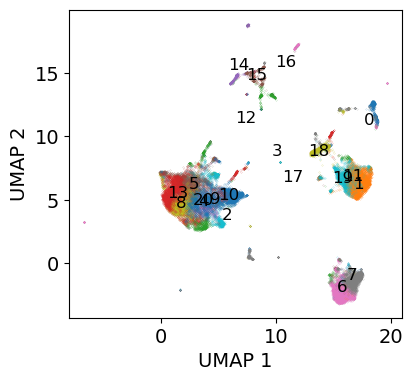

In [9]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小

unique_labels = np.unique(labels)
# label_counts = pd.Series(labels).value_counts()
# label_ranks = label_counts.rank(method='min', ascending=False).astype(int)
# ranked_labels = [f'{label_ranks[label]}' for label in labels]

for label in unique_labels:
    # Filter points belonging to the current label
    points = embedding_umap[labels == label]
    
    # Plot points with a larger size
    plt.scatter(points[:, 0], points[:, 1], label=label, s=0.01)  # Adjust the size with the 's' parameter
    
    # Calculate the centroid of the points and annotate with the label
    centroid = np.mean(points, axis=0)
    plt.text(centroid[0], centroid[1], label, fontsize=12, ha='center', va='center')

# plt.scatter(embedding_umap[:, 0], embedding_umap[:,1], c=labels)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')

## WNN

### intersect protein

In [89]:
## inner
import muon as mu
mdata = mu.read_h5mu("SLN_mergeAll_111_206_WNN_inner.h5mu")
mdata

MuData object with n_obs × n_vars = 32648 × 13663
  obs:	'leiden_wnn'
  var:	'highly_variable', 'mean', 'std'
  uns:	'leiden', 'leiden_wnn_colors', 'umap', 'wnn'
  obsm:	'X_umap', 'X_wnn_umap'
  obsp:	'wnn_connectivities', 'wnn_distances'
  2 modalities
    rna:	32648 x 13553
      obs:	'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'leiden'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
      uns:	'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      layers:	'counts'
      obsp:	'connectivities', 'distances'
    prot:	32648 x 110
      obs:	'leiden'
      var:	'highly_variable', 'mean', 'std'
      uns:	'leiden', 'log1p', 'neighbors', 'pca'
      obsm:	'X_pca'
      varm:	'PCs'
      layers:	'counts'
      obsp:	'connectivities', 'distances'

In [91]:
## ----- leiden mixing metric -----

embedding = mdata.obsm['X_wnn_umap']
labels = mdata.obs['leiden_wnn']
embedding.shape

#Calculate the measurement mixing metric for the integration results.
metric = measurement_mixing_metric(embedding, labels)
print("The mixing metric is :", metric)


The mixing metric is : 0.6111145128029319


In [ ]:
import pandas as pd
embedding = mdata.obsm["X_wnn_umap"]
mdata.obs["leiden_wnn"]
# print(embedding.iloc[1:3,1:3])
embedding.shape

(32648, 20)

In [ ]:
umap = UMAP(n_neighbors=15, n_components=2, random_state=42)
embedding_umap = umap.fit_transform(embedding)

n_clusters = 21  # 假设你想将数据聚类成3个群
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(embedding)

/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [ ]:
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(embedding, labels)
print("The average silhouette_score is :", silhouette_avg)

silhouette_avg = silhouette_score(embedding_umap, labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.07760731
The average silhouette_score is : 0.12304872


Text(0, 0.5, 'UMAP 2')

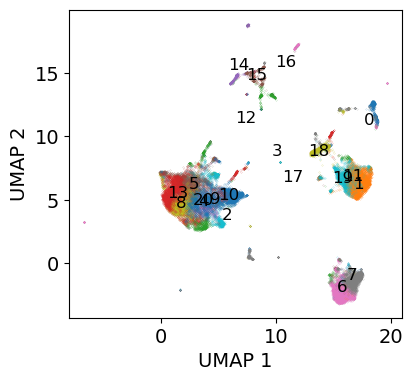

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小

unique_labels = np.unique(labels)
# label_counts = pd.Series(labels).value_counts()
# label_ranks = label_counts.rank(method='min', ascending=False).astype(int)
# ranked_labels = [f'{label_ranks[label]}' for label in labels]

for label in unique_labels:
    # Filter points belonging to the current label
    points = embedding_umap[labels == label]
    
    # Plot points with a larger size
    plt.scatter(points[:, 0], points[:, 1], label=label, s=0.01)  # Adjust the size with the 's' parameter
    
    # Calculate the centroid of the points and annotate with the label
    centroid = np.mean(points, axis=0)
    plt.text(centroid[0], centroid[1], label, fontsize=12, ha='center', va='center')

# plt.scatter(embedding_umap[:, 0], embedding_umap[:,1], c=labels)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小

unique_labels = np.unique(labels)
# label_counts = pd.Series(labels).value_counts()
# label_ranks = label_counts.rank(method='min', ascending=False).astype(int)
# ranked_labels = [f'{label_ranks[label]}' for label in labels]

for label in unique_labels:
    # Filter points belonging to the current label
    points = embedding_umap[labels == label]
    
    # Plot points with a larger size
    plt.scatter(points[:, 0], points[:, 1], label=label, s=0.01)  # Adjust the size with the 's' parameter
    
    # Calculate the centroid of the points and annotate with the label
    centroid = np.mean(points, axis=0)
    plt.text(centroid[0], centroid[1], label, fontsize=12, ha='center', va='center')

# plt.scatter(embedding_umap[:, 0], embedding_umap[:,1], c=labels)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')

# Evaluation and beautiful plot

## GCAT

### inner

#### hvg

In [81]:
import scanpy as sc
import muon as mu
adata = sc.read('./SLN_mergeAll_111_206_GCAT_intersect.h5ad')
adata

AnnData object with n_obs × n_vars = 32648 × 3999
    obs: 'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', 'leiden_GCAT', 'Lcelltype'
    uns: 'Lcelltype_colors', 'batch_colors', 'cell_types_colors', 'leiden', 'leiden_GCAT_colors', 'neighbors', 'panel_colors', 'umap'
    obsm: 'X_GCAT', 'X_umap'
    obsp: 'connectivities', 'distances'

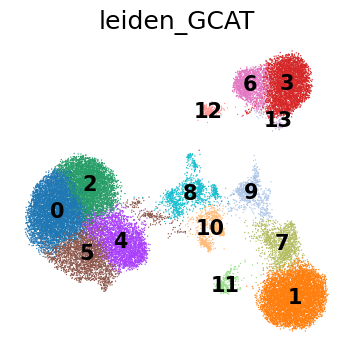

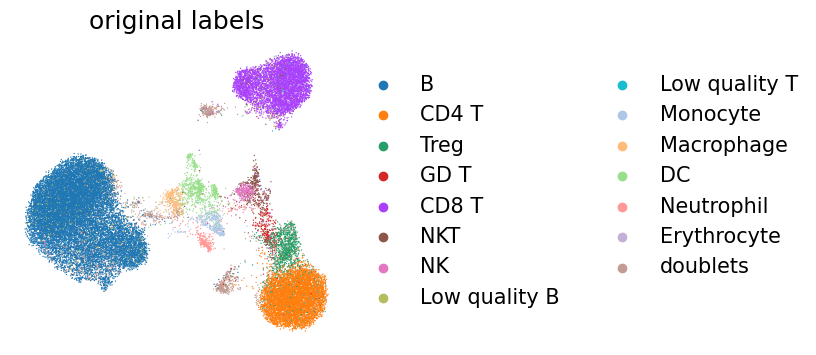

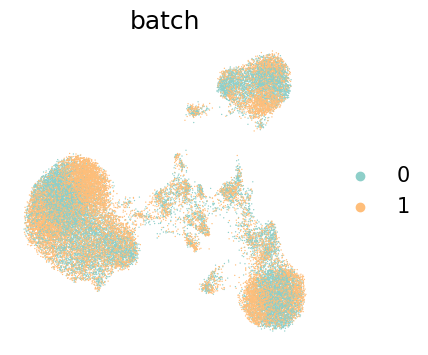

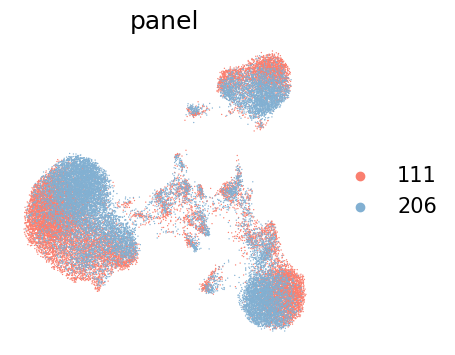

In [82]:
reassign_cluster_names = {
    "Neutrophils": "Neutrophil",
    "Plasma B": "B",
    "Red-pulp macrophages": "Macrophage",
    "T doublets": "doublets",
    "Transitional B": "B",
    "Tregs": "Treg",
    "cDC1s": "DC",
    "cDC2s": "DC",
    "pDCs": "DC",
    "B doublets": "doublets",
    "B-CD4 T cell doublets": "doublets",
    "B-CD8 T cell doublets": "doublets",
    "B-macrophage doublets": "doublets",
    "B1 B": "B",
    "CD122+ CD8 T": "CD8 T",
    "CD4 T": "CD4 T",
    "CD8 T": "CD8 T",
    "Cycling B/T cells": "doublets",
    "Erythrocytes": "Erythrocyte",
    "GD T": "GD T",
    "ICOS-high Tregs": "Treg",
    "Activated CD4 T": "CD4 T",
    "Ifit3-high B": "B",
    "Ifit3-high CD4 T": "CD4 T",
    "Ifit3-high CD8 T": "CD8 T",
    "Low quality B cells": "Low quality B",
    "Low quality T cells": "Low quality T",
    "Ly6-high mono": "Monocyte",
    "Ly6-low mono": "Monocyte",
    "MZ B": "B",
    "MZ/Marco-high macrophages": "Macrophage",
    "Mature B": "B",
    "Migratory DCs": "DC",
    "NK": "NK",
    "NKT": "NKT",
}
# adata.obs['Lcelltype'] = adata.obs['cell_types'].map(reassign_cluster_names).astype('category')

# adata.obs['Lcelltype'] = adata.obs['Lcelltype'].cat.reorder_categories(['B', 'CD4 T','Treg','GD T', 'CD8 T','NKT','NK', 
#                                                                          'Low quality B','Low quality T',
#                                                                          'Monocyte','Macrophage','DC','Neutrophil', 
#                                                                          'Erythrocyte','doublets'])

adata.uns['panel_colors'] = ["#FA7F6F" ,"#82B0D2"]
adata.uns['batch_colors'] = ["#8ECFC9", "#FFBE7A"]

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小

mu.pl.embedding(adata,basis="X_umap",color=["leiden_GCAT"],title='leiden_GCAT',
    frameon=False,legend_loc='on data',ncols=1)
mu.pl.embedding(adata,basis="X_umap",color=["Lcelltype"],title='original labels',
    frameon=False,ncols=1)

plt.rcParams["figure.figsize"] = (4,4)
mu.pl.embedding(adata,basis="X_umap",color=[ "batch"],title='batch',
    frameon=False,ncols=1)

mu.pl.embedding(adata,basis="X_umap",color=[ "panel"],title='panel',
    frameon=False,ncols=1)

#### wholegenes

In [92]:
import scanpy as sc
adata = sc.read_h5ad('./SLN_mergeAll_111_206_GCAT_intersect_wholeGenes.h5ad')
adata

AnnData object with n_obs × n_vars = 32648 × 13553
    obs: 'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', 'leiden_GCAT', 'Lcelltype'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'Lcelltype_colors', 'batch_colors', 'cell_types_colors', 'hvg', 'leiden', 'leiden_GCAT_colors', 'log1p', 'neighbors', 'panel_colors', 'umap'
    obsm: 'X_GCAT', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

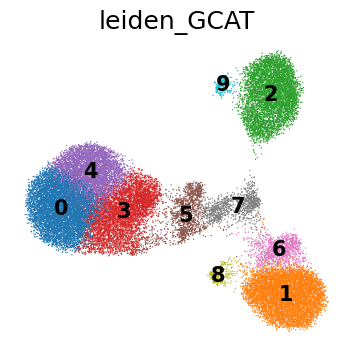

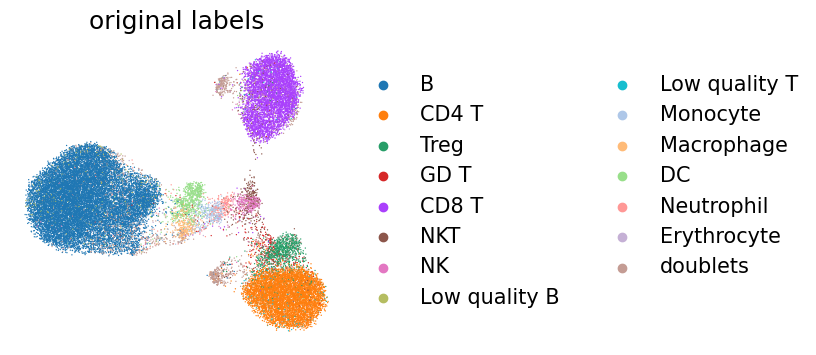

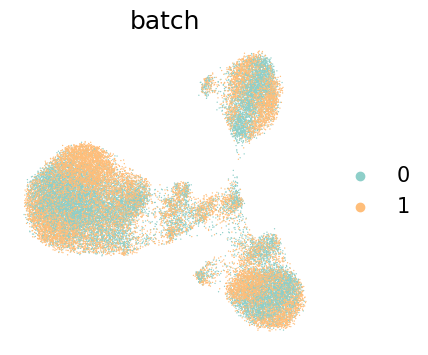

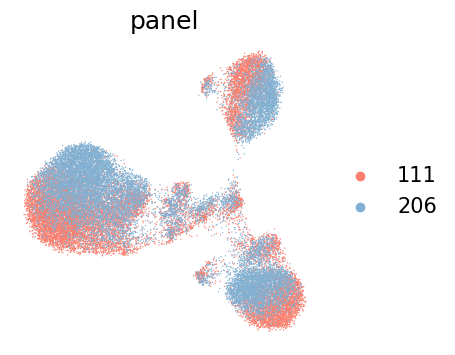

In [93]:
reassign_cluster_names = {
    "Neutrophils": "Neutrophil",
    "Plasma B": "B",
    "Red-pulp macrophages": "Macrophage",
    "T doublets": "doublets",
    "Transitional B": "B",
    "Tregs": "Treg",
    "cDC1s": "DC",
    "cDC2s": "DC",
    "pDCs": "DC",
    "B doublets": "doublets",
    "B-CD4 T cell doublets": "doublets",
    "B-CD8 T cell doublets": "doublets",
    "B-macrophage doublets": "doublets",
    "B1 B": "B",
    "CD122+ CD8 T": "CD8 T",
    "CD4 T": "CD4 T",
    "CD8 T": "CD8 T",
    "Cycling B/T cells": "doublets",
    "Erythrocytes": "Erythrocyte",
    "GD T": "GD T",
    "ICOS-high Tregs": "Treg",
    "Activated CD4 T": "CD4 T",
    "Ifit3-high B": "B",
    "Ifit3-high CD4 T": "CD4 T",
    "Ifit3-high CD8 T": "CD8 T",
    "Low quality B cells": "Low quality B",
    "Low quality T cells": "Low quality T",
    "Ly6-high mono": "Monocyte",
    "Ly6-low mono": "Monocyte",
    "MZ B": "B",
    "MZ/Marco-high macrophages": "Macrophage",
    "Mature B": "B",
    "Migratory DCs": "DC",
    "NK": "NK",
    "NKT": "NKT",
}
# adata.obs['Lcelltype'] = adata.obs['cell_types'].map(reassign_cluster_names).astype('category')

# adata.obs['Lcelltype'] = adata.obs['Lcelltype'].cat.reorder_categories(['B', 'CD4 T','Treg','GD T', 'CD8 T','NKT','NK', 
#                                                                          'Low quality B','Low quality T',
#                                                                          'Monocyte','Macrophage','DC','Neutrophil', 
#                                                                          'Erythrocyte','doublets'])

adata.uns['panel_colors'] = ["#FA7F6F" ,"#82B0D2"]
adata.uns['batch_colors'] = ["#8ECFC9", "#FFBE7A"]

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小

mu.pl.embedding(adata,basis="X_umap",color=["leiden_GCAT"],title='leiden_GCAT',
    frameon=False,legend_loc='on data',ncols=1)
mu.pl.embedding(adata,basis="X_umap",color=["Lcelltype"],title='original labels',
    frameon=False,ncols=1)

plt.rcParams["figure.figsize"] = (4,4)
mu.pl.embedding(adata,basis="X_umap",color=[ "batch"],title='batch',
    frameon=False,ncols=1)

mu.pl.embedding(adata,basis="X_umap",color=[ "panel"],title='panel',
    frameon=False,ncols=1)

### outer

In [78]:
import scanpy as sc
import muon as mu
adata = sc.read('./SLN_mergeAll_111_206_GCAT_union.h5ad')
adata

AnnData object with n_obs × n_vars = 32648 × 4000
    obs: 'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', 'leiden_GCAT', 'Lcelltype'
    uns: 'Lcelltype_colors', 'batch_colors', 'cell_types_colors', 'leiden', 'leiden_GCAT_colors', 'neighbors', 'panel_colors', 'umap'
    obsm: 'X_GCAT', 'X_umap'
    obsp: 'connectivities', 'distances'

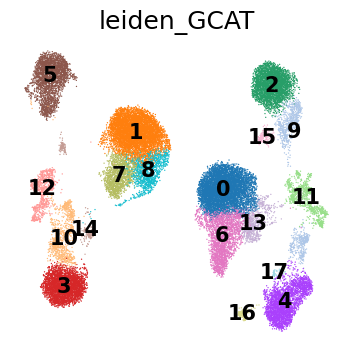

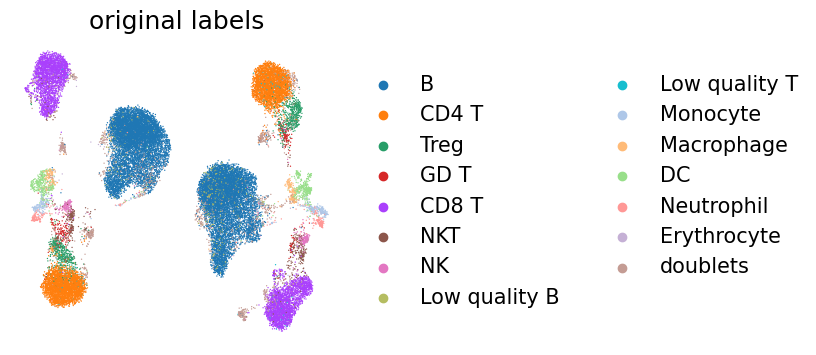

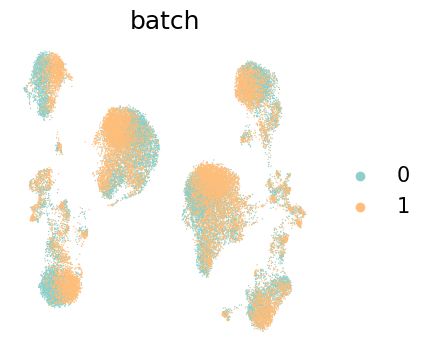

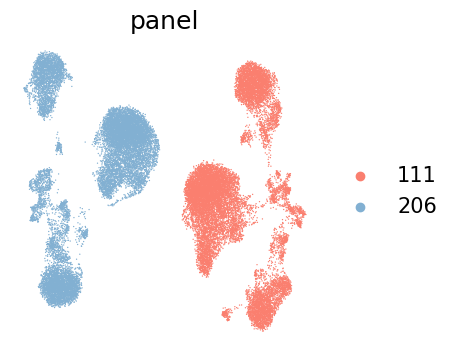

In [80]:
reassign_cluster_names = {
    "Neutrophils": "Neutrophil",
    "Plasma B": "B",
    "Red-pulp macrophages": "Macrophage",
    "T doublets": "doublets",
    "Transitional B": "B",
    "Tregs": "Treg",
    "cDC1s": "DC",
    "cDC2s": "DC",
    "pDCs": "DC",
    "B doublets": "doublets",
    "B-CD4 T cell doublets": "doublets",
    "B-CD8 T cell doublets": "doublets",
    "B-macrophage doublets": "doublets",
    "B1 B": "B",
    "CD122+ CD8 T": "CD8 T",
    "CD4 T": "CD4 T",
    "CD8 T": "CD8 T",
    "Cycling B/T cells": "doublets",
    "Erythrocytes": "Erythrocyte",
    "GD T": "GD T",
    "ICOS-high Tregs": "Treg",
    "Activated CD4 T": "CD4 T",
    "Ifit3-high B": "B",
    "Ifit3-high CD4 T": "CD4 T",
    "Ifit3-high CD8 T": "CD8 T",
    "Low quality B cells": "Low quality B",
    "Low quality T cells": "Low quality T",
    "Ly6-high mono": "Monocyte",
    "Ly6-low mono": "Monocyte",
    "MZ B": "B",
    "MZ/Marco-high macrophages": "Macrophage",
    "Mature B": "B",
    "Migratory DCs": "DC",
    "NK": "NK",
    "NKT": "NKT",
}
# adata.obs['Lcelltype'] = adata.obs['cell_types'].map(reassign_cluster_names).astype('category')

# adata.obs['Lcelltype'] = adata.obs['Lcelltype'].cat.reorder_categories(['B', 'CD4 T','Treg','GD T', 'CD8 T','NKT','NK', 
#                                                                          'Low quality B','Low quality T',
#                                                                          'Monocyte','Macrophage','DC','Neutrophil', 
#                                                                          'Erythrocyte','doublets'])

adata.uns['panel_colors'] = ["#FA7F6F" ,"#82B0D2"]
adata.uns['batch_colors'] = ["#8ECFC9", "#FFBE7A"]

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小

mu.pl.embedding(adata,basis="X_umap",color=["leiden_GCAT"],title='leiden_GCAT',
    frameon=False,legend_loc='on data',ncols=1)
mu.pl.embedding(adata,basis="X_umap",color=["Lcelltype"],title='original labels',
    frameon=False,ncols=1)

plt.rcParams["figure.figsize"] = (4,4)
mu.pl.embedding(adata,basis="X_umap",color=[ "batch"],title='batch',
    frameon=False,ncols=1)

mu.pl.embedding(adata,basis="X_umap",color=[ "panel"],title='panel',
    frameon=False,ncols=1)

## totalVI

#### inner

In [62]:
## inner
import muon as mu
adata_totalVI = mu.read_h5mu('SLM_mergeAll_111_206_totalVI_inner.h5mu')
adata_totalVI

# 轮廓系数 (Silhouette Coefficient): 这是一种评估聚类效果的指标，它结合了聚类的密集程度和分离程度。对于每个样本，轮廓系数是样本与同类其他样本的平均距离（内聚度）与样本与最近的非同类样本的平均距离（分离度）之间的差值，除以两者之间的较大值。轮廓系数的值范围在 -1 到 1 之间，接近 1 表示样本聚集得很好，接近 -1 表示样本聚集得很差。
from sklearn.metrics import silhouette_score
labels = adata_totalVI.mod["rna_subset"].obs["leiden_totalVI"]

silhouette_avg = silhouette_score(adata_totalVI.mod["rna_subset"].obsm["X_totalVI"], labels)
print("The average silhouette_score is :", silhouette_avg)

from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(adata_totalVI.mod["rna_subset"].obsm["X_umap"], labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.08869096
The average silhouette_score is : 0.22717266


In [60]:
## inner
import muon as mu
adata_totalVI = mu.read_h5mu('SLM_mergeAll_111_206_totalVI_inner.h5mu')
adata_totalVI

/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/mudata/_core/mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


MuData object with n_obs × n_vars = 32648 × 17663
  obs:	'_scvi_labels', '_scvi_raw_norm_scaling'
  uns:	'_scvi_manager_uuid', '_scvi_uuid'
  3 modalities
    rna:	32648 x 13553
      obs:	'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
      uns:	'hvg', 'log1p'
      layers:	'counts'
    protein:	32648 x 110
      obs:	'_scvi_batch'
      var:	'clean_names'
      layers:	'denoised_protein', 'protein_foreground_prob'
    rna_subset:	32648 x 4000
      obs:	'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', '_scvi_batch', 'leiden_totalVI'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
      uns:	'hvg', 'leiden', 'log1p', 'neighbors', 'rna_subset:batch_colors', 'rna_subset:leiden_totalVI_colors', 'rna_subset:panel_colors', 'umap'
      obsm:	'X_totalVI', 'X_umap'
      layers:	'counts', 'denoised_rna'
      obsp:	'connectivities', 'distances'

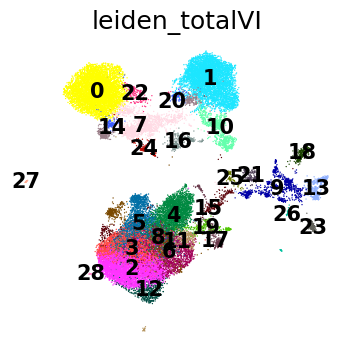

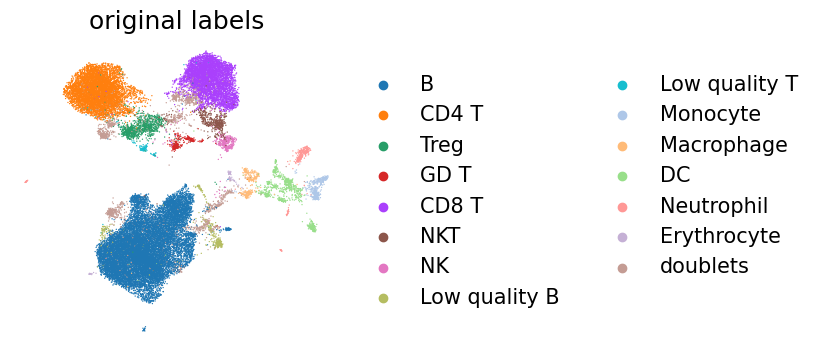

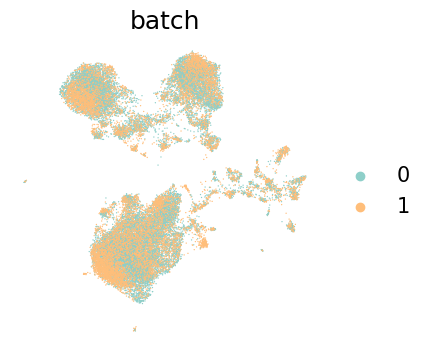

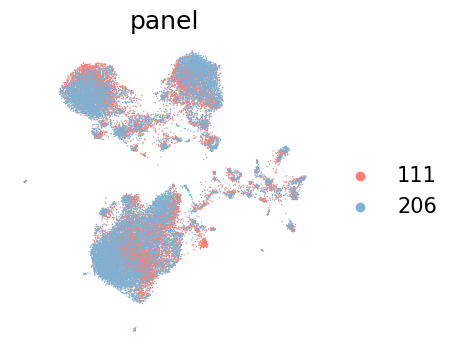

In [63]:
reassign_cluster_names = {
    "Neutrophils": "Neutrophil",
    "Plasma B": "B",
    "Red-pulp macrophages": "Macrophage",
    "T doublets": "doublets",
    "Transitional B": "B",
    "Tregs": "Treg",
    "cDC1s": "DC",
    "cDC2s": "DC",
    "pDCs": "DC",
    "B doublets": "doublets",
    "B-CD4 T cell doublets": "doublets",
    "B-CD8 T cell doublets": "doublets",
    "B-macrophage doublets": "doublets",
    "B1 B": "B",
    "CD122+ CD8 T": "CD8 T",
    "CD4 T": "CD4 T",
    "CD8 T": "CD8 T",
    "Cycling B/T cells": "doublets",
    "Erythrocytes": "Erythrocyte",
    "GD T": "GD T",
    "ICOS-high Tregs": "Treg",
    "Activated CD4 T": "CD4 T",
    "Ifit3-high B": "B",
    "Ifit3-high CD4 T": "CD4 T",
    "Ifit3-high CD8 T": "CD8 T",
    "Low quality B cells": "Low quality B",
    "Low quality T cells": "Low quality T",
    "Ly6-high mono": "Monocyte",
    "Ly6-low mono": "Monocyte",
    "MZ B": "B",
    "MZ/Marco-high macrophages": "Macrophage",
    "Mature B": "B",
    "Migratory DCs": "DC",
    "NK": "NK",
    "NKT": "NKT",
}
adata_totalVI.obs['Lcelltype'] = adata_totalVI['rna_subset'].obs['cell_types'].map(reassign_cluster_names).astype('category')

adata_totalVI.obs['Lcelltype'] = adata_totalVI.obs['Lcelltype'].cat.reorder_categories(['B', 'CD4 T','Treg','GD T', 'CD8 T','NKT','NK', 
                                                                         'Low quality B','Low quality T',
                                                                         'Monocyte','Macrophage','DC','Neutrophil', 
                                                                         'Erythrocyte','doublets'])

adata_totalVI['rna_subset'].uns['rna_subset:panel_colors'] = ["#FA7F6F" ,"#82B0D2"]
adata_totalVI['rna_subset'].uns['rna_subset:batch_colors'] = ["#8ECFC9", "#FFBE7A"]

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小

mu.pl.embedding(adata_totalVI,basis="rna_subset:X_umap",color=["rna_subset:leiden_totalVI"],title='leiden_totalVI',
    frameon=False,legend_loc='on data',ncols=1)
mu.pl.embedding(adata_totalVI,basis="rna_subset:X_umap",color=["Lcelltype"],title='original labels',
    frameon=False,ncols=1)

plt.rcParams["figure.figsize"] = (4,4)
mu.pl.embedding(adata_totalVI,basis="rna_subset:X_umap",color=[ "rna_subset:batch"],title='batch',
    frameon=False,ncols=1)

mu.pl.embedding(adata_totalVI,basis="rna_subset:X_umap",color=[ "rna_subset:panel"],title='panel',
    frameon=False,ncols=1)

#### outer

In [63]:
## outer
import muon as mu
adata_totalVI = mu.read_h5mu('SLM_mergeAll_111_206_totalVI_outer.h5mu')
adata_totalVI

# 轮廓系数 (Silhouette Coefficient): 这是一种评估聚类效果的指标，它结合了聚类的密集程度和分离程度。对于每个样本，轮廓系数是样本与同类其他样本的平均距离（内聚度）与样本与最近的非同类样本的平均距离（分离度）之间的差值，除以两者之间的较大值。轮廓系数的值范围在 -1 到 1 之间，接近 1 表示样本聚集得很好，接近 -1 表示样本聚集得很差。
from sklearn.metrics import silhouette_score
labels = adata_totalVI.mod["rna_subset"].obs["leiden_totalVI"]

silhouette_avg = silhouette_score(adata_totalVI.mod["rna_subset"].obsm["X_totalVI"], labels)
print("The average silhouette_score is :", silhouette_avg)

from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(adata_totalVI.mod["rna_subset"].obsm["X_umap"], labels)
print("The average silhouette_score is :", silhouette_avg)

/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/mudata/_core/mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


The average silhouette_score is : 0.08840511
The average silhouette_score is : 0.35757306


In [34]:
## outer
import muon as mu
adata_totalVI = mu.read_h5mu('SLM_mergeAll_111_206_totalVI_outer.h5mu')
adata_totalVI

/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/mudata/_core/mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


MuData object with n_obs × n_vars = 32648 × 17760
  obs:	'_scvi_labels'
  uns:	'_scvi_manager_uuid', '_scvi_uuid'
  3 modalities
    rna:	32648 x 13553
      obs:	'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
      uns:	'hvg', 'log1p'
      layers:	'counts'
    protein:	32648 x 207
      obs:	'_scvi_batch'
      var:	'clean_names'
      layers:	'denoised_protein', 'protein_foreground_prob'
    rna_subset:	32648 x 4000
      obs:	'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', '_scvi_batch', 'leiden_totalVI'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
      uns:	'hvg', 'leiden', 'log1p', 'neighbors', 'rna_subset:batch_colors', 'rna_subset:leiden_totalVI_colors', 'rna_subset:panel_colors', 'umap'
      obsm:	'X_totalVI', 'X_umap'
      layers:	'counts', 'denoised_rna'
      obsp:	'connectivities', 'distances'

In [56]:
reassign_cluster_names = {
    "Neutrophils": "Neutrophil",
    "Plasma B": "B",
    "Red-pulp macrophages": "Macrophage",
    "T doublets": "doublets",
    "Transitional B": "B",
    "Tregs": "Treg",
    "cDC1s": "DC",
    "cDC2s": "DC",
    "pDCs": "DC",
    "B doublets": "doublets",
    "B-CD4 T cell doublets": "doublets",
    "B-CD8 T cell doublets": "doublets",
    "B-macrophage doublets": "doublets",
    "B1 B": "B",
    "CD122+ CD8 T": "CD8 T",
    "CD4 T": "CD4 T",
    "CD8 T": "CD8 T",
    "Cycling B/T cells": "doublets",
    "Erythrocytes": "Erythrocyte",
    "GD T": "GD T",
    "ICOS-high Tregs": "Treg",
    "Activated CD4 T": "CD4 T",
    "Ifit3-high B": "B",
    "Ifit3-high CD4 T": "CD4 T",
    "Ifit3-high CD8 T": "CD8 T",
    "Low quality B cells": "Low quality B",
    "Low quality T cells": "Low quality T",
    "Ly6-high mono": "Monocyte",
    "Ly6-low mono": "Monocyte",
    "MZ B": "B",
    "MZ/Marco-high macrophages": "Macrophage",
    "Mature B": "B",
    "Migratory DCs": "DC",
    "NK": "NK",
    "NKT": "NKT",
}
adata_totalVI.obs['Lcelltype'] = adata_totalVI['rna_subset'].obs['cell_types'].map(reassign_cluster_names).astype('category')

adata_totalVI.obs['Lcelltype'] = adata_totalVI.obs['Lcelltype'].cat.reorder_categories(['B', 'CD4 T','Treg','GD T', 'CD8 T','NKT','NK', 
                                                                         'Low quality B','Low quality T',
                                                                         'Monocyte','Macrophage','DC','Neutrophil', 
                                                                         'Erythrocyte','doublets'])

adata_totalVI['rna_subset'].uns['rna_subset:panel_colors'] = ["#FA7F6F" ,"#82B0D2"]
adata_totalVI['rna_subset'].uns['rna_subset:batch_colors'] = ["#8ECFC9", "#FFBE7A"]

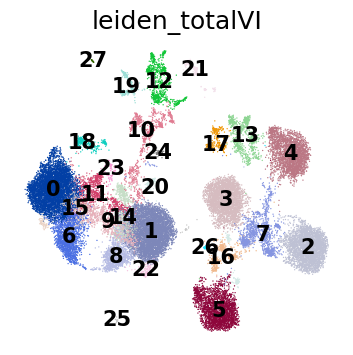

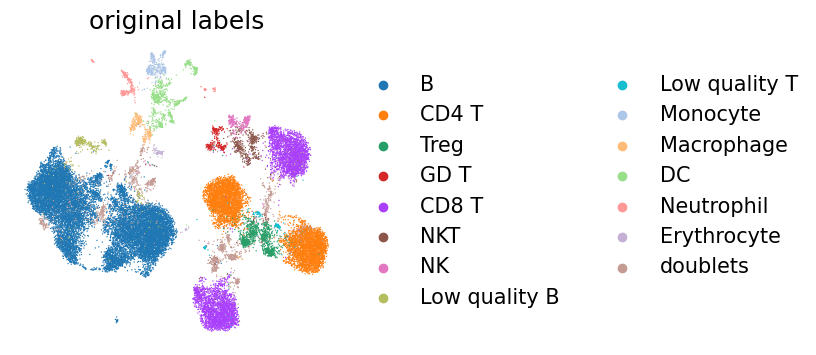

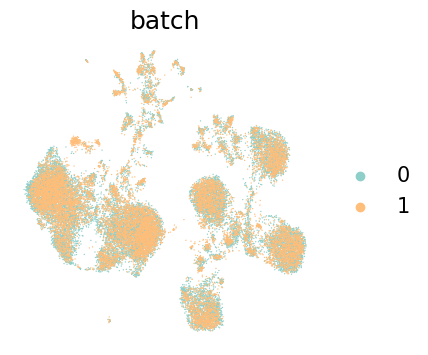

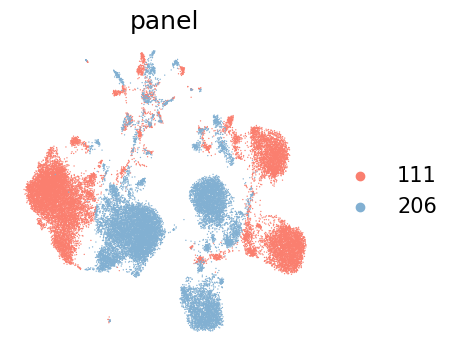

In [59]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小

mu.pl.embedding(adata_totalVI,basis="rna_subset:X_umap",color=["rna_subset:leiden_totalVI"],title='leiden_totalVI',
    frameon=False,legend_loc='on data',ncols=1)
mu.pl.embedding(adata_totalVI,basis="rna_subset:X_umap",color=["Lcelltype"],title='original labels',
    frameon=False,ncols=1)

plt.rcParams["figure.figsize"] = (4,4)
mu.pl.embedding(adata_totalVI,basis="rna_subset:X_umap",color=[ "rna_subset:batch"],title='batch',
    frameon=False,ncols=1)

mu.pl.embedding(adata_totalVI,basis="rna_subset:X_umap",color=[ "rna_subset:panel"],title='panel',
    frameon=False,ncols=1)

## WNN

#### inner

In [66]:
## inner
import muon as mu
mdata = mu.read_h5mu("SLN_mergeAll_111_206_WNN_inner.h5mu")

# 轮廓系数 (Silhouette Coefficient): 这是一种评估聚类效果的指标，它结合了聚类的密集程度和分离程度。对于每个样本，轮廓系数是样本与同类其他样本的平均距离（内聚度）与样本与最近的非同类样本的平均距离（分离度）之间的差值，除以两者之间的较大值。轮廓系数的值范围在 -1 到 1 之间，接近 1 表示样本聚集得很好，接近 -1 表示样本聚集得很差。
from sklearn.metrics import silhouette_score
labels = mdata.obs["leiden_wnn"]

silhouette_avg = silhouette_score(mdata.obsm["X_wnn_umap"], labels)
print("The average silhouette_score is :", silhouette_avg)

# from sklearn.metrics import silhouette_score
# silhouette_avg = silhouette_score(mdata.mod["rna_subset"].obsm["X_umap"], labels)
# print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.44906506


In [72]:
## inner
import muon as mu
mdata = mu.read_h5mu("SLN_mergeAll_111_206_WNN_inner.h5mu")
mdata

MuData object with n_obs × n_vars = 32648 × 13663
  obs:	'leiden_wnn'
  var:	'highly_variable', 'mean', 'std'
  uns:	'leiden', 'leiden_wnn_colors', 'umap', 'wnn'
  obsm:	'X_umap', 'X_wnn_umap'
  obsp:	'wnn_connectivities', 'wnn_distances'
  2 modalities
    rna:	32648 x 13553
      obs:	'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'leiden'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
      uns:	'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      layers:	'counts'
      obsp:	'connectivities', 'distances'
    prot:	32648 x 110
      obs:	'leiden'
      var:	'highly_variable', 'mean', 'std'
      uns:	'leiden', 'log1p', 'neighbors', 'pca'
      obsm:	'X_pca'
      varm:	'PCs'
      layers:	'counts'
      obsp:	'connectivities', 'distances'

In [18]:
mdata.uns['wnn']
# mdata.obs['leiden_wnn']

{'connectivities_key': 'wnn_connectivities',
 'distances_key': 'wnn_distances',
 'params': {'eps': 0.0001,
  'method': 'umap',
  'metric': 'euclidean',
  'n_multineighbors': 200,
  'n_neighbors': 12,
  'n_pcs': {'prot': -1, 'rna': 50},
  'random_state': 42,
  'use_rep': {'prot': -1, 'rna': -1}}}

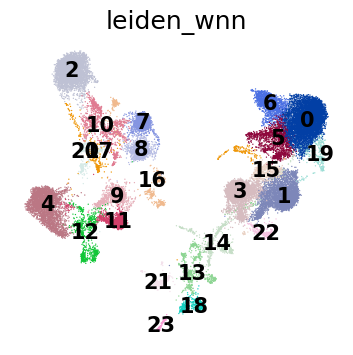

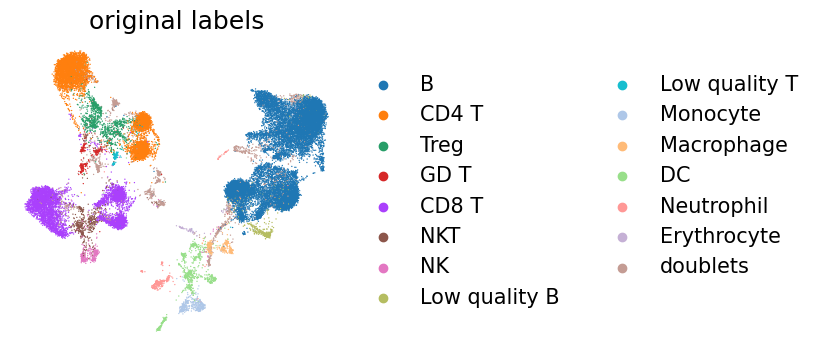

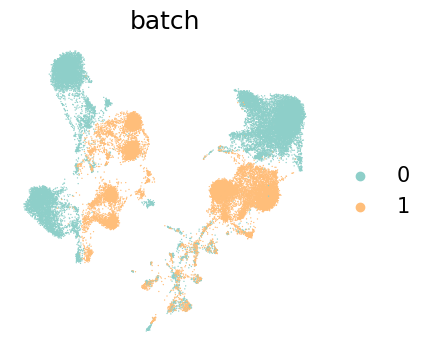

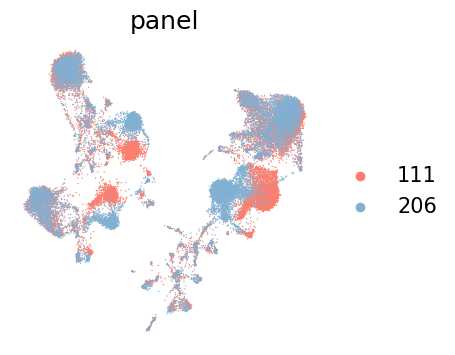

In [73]:
reassign_cluster_names = {
    "Neutrophils": "Neutrophil",
    "Plasma B": "B",
    "Red-pulp macrophages": "Macrophage",
    "T doublets": "doublets",
    "Transitional B": "B",
    "Tregs": "Treg",
    "cDC1s": "DC",
    "cDC2s": "DC",
    "pDCs": "DC",
    "B doublets": "doublets",
    "B-CD4 T cell doublets": "doublets",
    "B-CD8 T cell doublets": "doublets",
    "B-macrophage doublets": "doublets",
    "B1 B": "B",
    "CD122+ CD8 T": "CD8 T",
    "CD4 T": "CD4 T",
    "CD8 T": "CD8 T",
    "Cycling B/T cells": "doublets",
    "Erythrocytes": "Erythrocyte",
    "GD T": "GD T",
    "ICOS-high Tregs": "Treg",
    "Activated CD4 T": "CD4 T",
    "Ifit3-high B": "B",
    "Ifit3-high CD4 T": "CD4 T",
    "Ifit3-high CD8 T": "CD8 T",
    "Low quality B cells": "Low quality B",
    "Low quality T cells": "Low quality T",
    "Ly6-high mono": "Monocyte",
    "Ly6-low mono": "Monocyte",
    "MZ B": "B",
    "MZ/Marco-high macrophages": "Macrophage",
    "Mature B": "B",
    "Migratory DCs": "DC",
    "NK": "NK",
    "NKT": "NKT",
}
mdata.obs['Lcelltype'] = mdata['rna'].obs['cell_types'].map(reassign_cluster_names).astype('category')

mdata.obs['Lcelltype'] = mdata.obs['Lcelltype'].cat.reorder_categories(['B', 'CD4 T','Treg','GD T', 'CD8 T','NKT','NK', 
                                                                         'Low quality B','Low quality T',
                                                                         'Monocyte','Macrophage','DC','Neutrophil', 
                                                                         'Erythrocyte','doublets'])
mdata.obs['batch'] = mdata['rna'].obs['batch_indices'].astype('category')
mdata.obs['panel'] = mdata['rna'].obs['panel'] 

mdata.uns['panel_colors'] = ["#FA7F6F" ,"#82B0D2"]
mdata.uns['batch_colors'] = ["#8ECFC9", "#FFBE7A"]

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小

mu.pl.embedding(mdata,basis="X_wnn_umap",color=["leiden_wnn"],title='leiden_wnn',
    frameon=False,legend_loc='on data',ncols=1)
mu.pl.embedding(mdata,basis="X_wnn_umap",color=["Lcelltype"],title='original labels',
    frameon=False,ncols=1)

plt.rcParams["figure.figsize"] = (4,4)
mu.pl.embedding(mdata,basis="X_wnn_umap",color=[ "batch"],title='batch',
    frameon=False,ncols=1)

mu.pl.embedding(mdata,basis="X_wnn_umap",color=[ "panel"],title='panel',
    frameon=False,ncols=1)

### outer

In [68]:
## outer
import muon as mu
mdata = mu.read_h5mu('SLN_mergeAll_111_206_WNN_outer.h5mu')
mdata

# 轮廓系数 (Silhouette Coefficient): 这是一种评估聚类效果的指标，它结合了聚类的密集程度和分离程度。对于每个样本，轮廓系数是样本与同类其他样本的平均距离（内聚度）与样本与最近的非同类样本的平均距离（分离度）之间的差值，除以两者之间的较大值。轮廓系数的值范围在 -1 到 1 之间，接近 1 表示样本聚集得很好，接近 -1 表示样本聚集得很差。
from sklearn.metrics import silhouette_score
labels = mdata.obs["leiden_wnn"]

silhouette_avg = silhouette_score(mdata.obsm["X_wnn_umap"], labels)
print("The average silhouette_score is :", silhouette_avg)

# from sklearn.metrics import silhouette_score
# silhouette_avg = silhouette_score(mdata.mod["rna_subset"].obsm["X_umap"], labels)
# print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.42042795


In [75]:
## outer
import muon as mu
mdata = mu.read_h5mu('SLN_mergeAll_111_206_WNN_outer.h5mu')
mdata

MuData object with n_obs × n_vars = 32648 × 13760
  obs:	'leiden_wnn'
  var:	'highly_variable', 'mean', 'std'
  uns:	'leiden', 'leiden_wnn_colors', 'umap', 'wnn'
  obsm:	'X_umap', 'X_wnn_umap'
  obsp:	'wnn_connectivities', 'wnn_distances'
  2 modalities
    rna:	32648 x 13553
      obs:	'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'leiden'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
      uns:	'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      layers:	'counts'
      obsp:	'connectivities', 'distances'
    prot:	32648 x 207
      obs:	'leiden'
      var:	'highly_variable', 'mean', 'std'
      uns:	'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
      obsm:	'X_pca'
      varm:	'PCs'
      layers:	'counts'
      obsp:	'connectivities', 'distances'

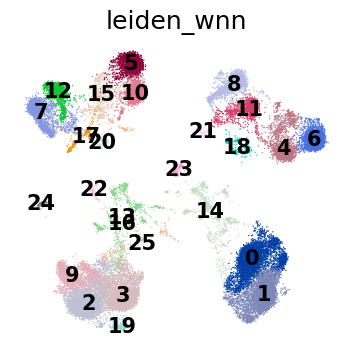

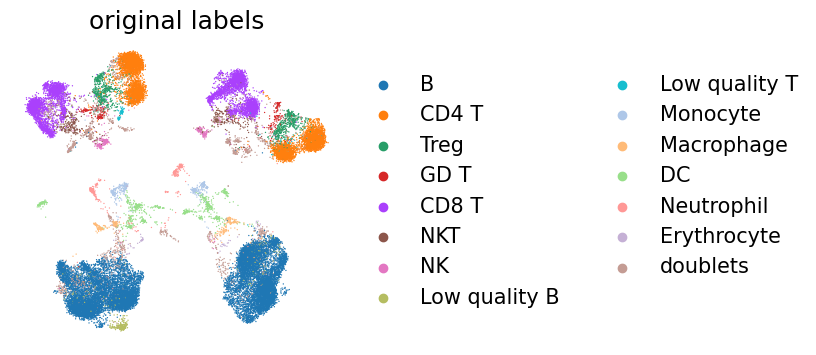

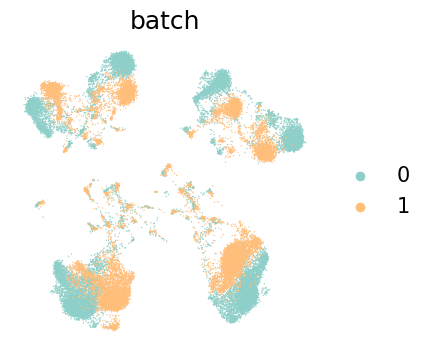

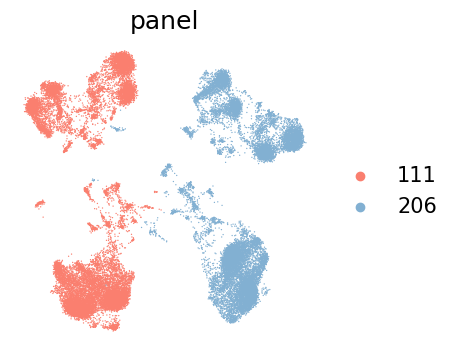

In [76]:
reassign_cluster_names = {
    "Neutrophils": "Neutrophil",
    "Plasma B": "B",
    "Red-pulp macrophages": "Macrophage",
    "T doublets": "doublets",
    "Transitional B": "B",
    "Tregs": "Treg",
    "cDC1s": "DC",
    "cDC2s": "DC",
    "pDCs": "DC",
    "B doublets": "doublets",
    "B-CD4 T cell doublets": "doublets",
    "B-CD8 T cell doublets": "doublets",
    "B-macrophage doublets": "doublets",
    "B1 B": "B",
    "CD122+ CD8 T": "CD8 T",
    "CD4 T": "CD4 T",
    "CD8 T": "CD8 T",
    "Cycling B/T cells": "doublets",
    "Erythrocytes": "Erythrocyte",
    "GD T": "GD T",
    "ICOS-high Tregs": "Treg",
    "Activated CD4 T": "CD4 T",
    "Ifit3-high B": "B",
    "Ifit3-high CD4 T": "CD4 T",
    "Ifit3-high CD8 T": "CD8 T",
    "Low quality B cells": "Low quality B",
    "Low quality T cells": "Low quality T",
    "Ly6-high mono": "Monocyte",
    "Ly6-low mono": "Monocyte",
    "MZ B": "B",
    "MZ/Marco-high macrophages": "Macrophage",
    "Mature B": "B",
    "Migratory DCs": "DC",
    "NK": "NK",
    "NKT": "NKT",
}
mdata.obs['Lcelltype'] = mdata['rna'].obs['cell_types'].map(reassign_cluster_names).astype('category')

mdata.obs['Lcelltype'] = mdata.obs['Lcelltype'].cat.reorder_categories(['B', 'CD4 T','Treg','GD T', 'CD8 T','NKT','NK', 
                                                                         'Low quality B','Low quality T',
                                                                         'Monocyte','Macrophage','DC','Neutrophil', 
                                                                         'Erythrocyte','doublets'])
mdata.obs['batch'] = mdata['rna'].obs['batch_indices'].astype('category')
mdata.obs['panel'] = mdata['rna'].obs['panel'] 

mdata.uns['panel_colors'] = ["#FA7F6F" ,"#82B0D2"]
mdata.uns['batch_colors'] = ["#8ECFC9", "#FFBE7A"]

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小

mu.pl.embedding(mdata,basis="X_wnn_umap",color=["leiden_wnn"],title='leiden_wnn',
    frameon=False,legend_loc='on data',ncols=1)
mu.pl.embedding(mdata,basis="X_wnn_umap",color=["Lcelltype"],title='original labels',
    frameon=False,ncols=1)

plt.rcParams["figure.figsize"] = (4,4)
mu.pl.embedding(mdata,basis="X_wnn_umap",color=[ "batch"],title='batch',
    frameon=False,ncols=1)

mu.pl.embedding(mdata,basis="X_wnn_umap",color=[ "panel"],title='panel',
    frameon=False,ncols=1)

## MOFA -读入数据时报错

In [86]:
mdata = mu.read_h5mu('SLN_mergeAll_111_206_MOFA.h5mu')

NotImplementedError: var_names seem to have been renamed and filtered at the same time. There is no way to restore the order. MuData object has to be re-created from these modalities:
  mdata1 = MuData(mdata.mod)

### leiden inner

#### load constructed RNA matrix

In [1]:
## inner
import pandas as pd
import scanpy as sc
import numpy as np
import muon as mu

mdata = mu.read_h5mu('SLM_mergeAll_111_206_totalVI_outer.h5mu')
mdata

2024-02-29 02:00:40.530751: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-29 02:00:41.596093: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/mudata/_core/mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


MuData object with n_obs × n_vars = 32648 × 17760
  obs:	'_scvi_labels'
  uns:	'_scvi_manager_uuid', '_scvi_uuid'
  3 modalities
    rna:	32648 x 13553
      obs:	'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
      uns:	'hvg', 'log1p'
      layers:	'counts'
    protein:	32648 x 207
      obs:	'_scvi_batch'
      var:	'clean_names'
      layers:	'denoised_protein', 'protein_foreground_prob'
    rna_subset:	32648 x 4000
      obs:	'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', '_scvi_batch', 'leiden_totalVI'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
      uns:	'hvg', 'leiden', 'log1p', 'neighbors', 'rna_subset:batch_colors', 'rna_subset:leiden_totalVI_colors', 'rna_subset:panel_colors', 'umap'
      obsm:	'X_totalVI', 'X_umap'
      layers:	'counts', 'denoised_rna'
      obsp:	'connectivities', 'distances'

In [2]:
exp = mdata['rna'].X
exp.shape

(32648, 13553)

In [15]:
import anndata as ad
adata = ad.AnnData(X=exp)#, obs=obs_info, var=var_info
adata.obs_names = mdata['rna'].obs_names
adata.var_names = mdata['rna'].var_names

In [16]:
metadata = pd.read_csv('./SLN_mergedAll_metaData.csv',index_col=0)
metadata.head(2)

,n_protein_counts,n_proteins,seurat_hash_id,batch_indices,hash_id,n_genes,percent_mito,leiden_subclusters,cell_types,n_counts,panel,batch
index,,,,,,,,,,,,
p111_AAACCCAAGGGTAATT-1,2319.0,100,Spleen,0,Spleen,3137,0.062138,"12,0",NKT,9836.0,111,0
p111_AAACCCAAGGTAAACT-1,3760.0,105,Spleen,0,Spleen,2256,0.057545,6,CD122+ CD8 T,7453.0,111,0


In [17]:
from collections import Counter
Counter(mdata['rna'].obs_names == metadata.index)

Counter({True: 32648})

In [18]:
embedding = pd.read_csv('SLN_mergeAll_111_206_MOFA_embedding_inner.csv',index_col=0)

In [19]:
adata.obs = metadata
adata.obsm['X_MOFA'] = embedding
# adata.obsm['X_umap'] = embedding_umap
# adata.obs['clusters'+'_'+str(n_clusters)] = labels

In [22]:
adata.obs['panel']=adata.obs['panel'].astype('category')
adata.obs['batch_indices']=adata.obs['batch_indices'].astype('category')
adata.obs['batch']=adata.obs['batch'].astype('category')
# adata.obs['clusters_21']=adata.obs['clusters_21'].astype('category')

In [23]:
sc.pp.neighbors(adata, use_rep='X_MOFA')
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added='leiden_MOFA')

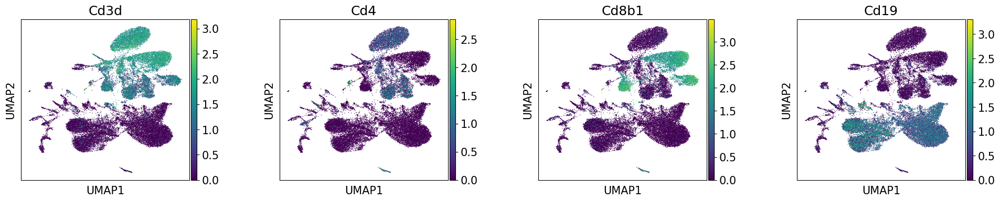

In [24]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.1,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小
# sc.pl.umap(adata,color=['1364','1007','225','1956'],wspace=0.4)
sc.pl.umap(adata,color=['Cd3d','Cd4','Cd8b1','Cd19'],wspace=0.4)

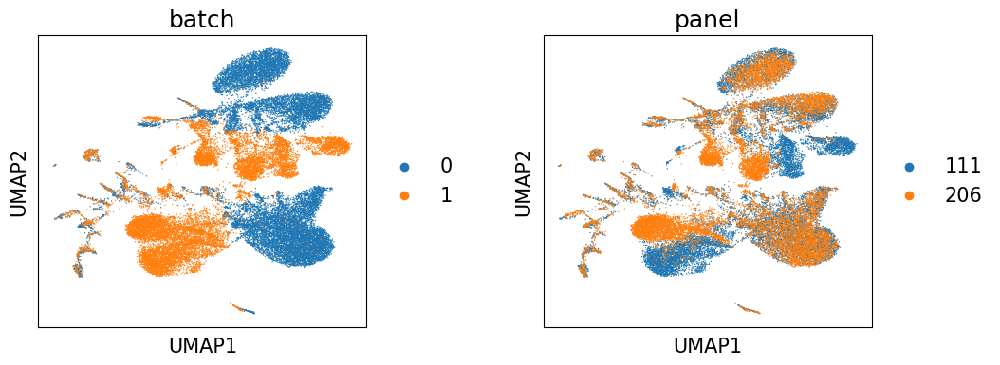

In [25]:
plt.rcParams["figure.figsize"] = (4.1,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小
sc.pl.umap(adata,color=['batch','panel'],wspace=0.4)

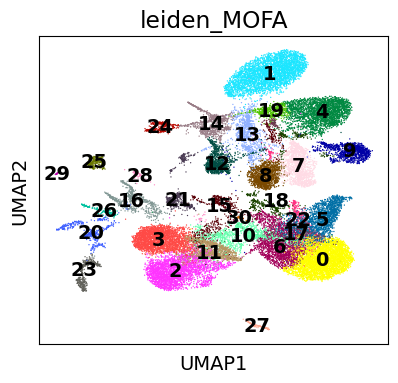

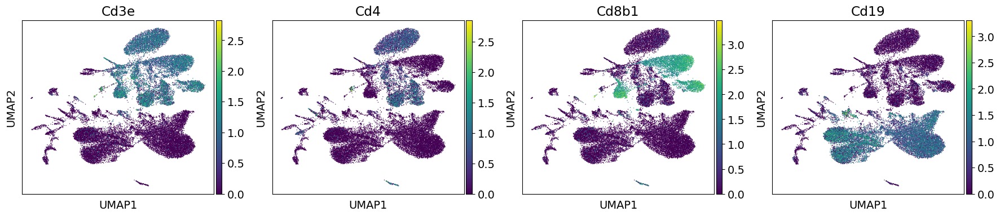

In [27]:
# 设置图的大小
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.5,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小
sc.pl.umap(adata,color=['leiden_MOFA'],legend_loc='on data')
sc.pl.umap(adata,color=['Cd3e','Cd4','Cd8b1','Cd19'],cmap='viridis',frameon=True)

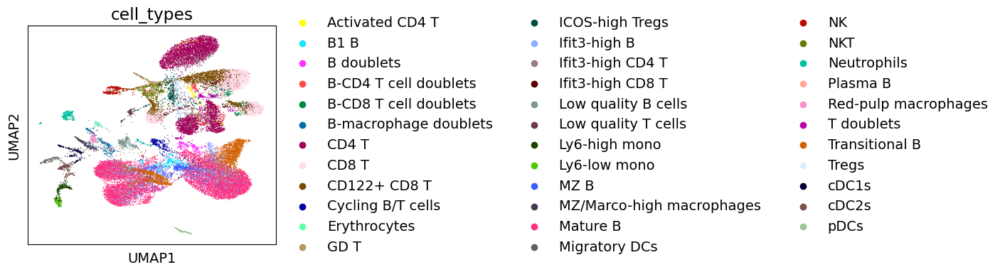

In [28]:
# 设置图的大小
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.5,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小
# sc.pl.umap(adata,color=['clusters_21'],legend_loc='on data')
sc.pl.umap(adata,color=['cell_types'])
# sc.pl.umap(adata,color=['Cd3e','Cd4','Cd8b1','Cd19'],cmap='viridis',frameon=True)

In [29]:
reassign_cluster_names = {
    "Neutrophils": "Neutrophil",
    "Plasma B": "B",
    "Red-pulp macrophages": "Macrophage",
    "T doublets": "doublets",
    "Transitional B": "B",
    "Tregs": "Treg",
    "cDC1s": "DC",
    "cDC2s": "DC",
    "pDCs": "DC",
    "B doublets": "doublets",
    "B-CD4 T cell doublets": "doublets",
    "B-CD8 T cell doublets": "doublets",
    "B-macrophage doublets": "doublets",
    "B1 B": "B",
    "CD122+ CD8 T": "CD8 T",
    "CD4 T": "CD4 T",
    "CD8 T": "CD8 T",
    "Cycling B/T cells": "doublets",
    "Erythrocytes": "Erythrocyte",
    "GD T": "GD T",
    "ICOS-high Tregs": "Treg",
    "Activated CD4 T": "CD4 T",
    "Ifit3-high B": "B",
    "Ifit3-high CD4 T": "CD4 T",
    "Ifit3-high CD8 T": "CD8 T",
    "Low quality B cells": "Low quality B",
    "Low quality T cells": "Low quality T",
    "Ly6-high mono": "Monocyte",
    "Ly6-low mono": "Monocyte",
    "MZ B": "B",
    "MZ/Marco-high macrophages": "Macrophage",
    "Mature B": "B",
    "Migratory DCs": "DC",
    "NK": "NK",
    "NKT": "NKT",
}
adata.obs['Lcelltype'] = adata.obs['cell_types'].map(reassign_cluster_names).astype('category')

In [30]:
adata.obs['Lcelltype'] = adata.obs['Lcelltype'].cat.reorder_categories(['B', 'CD4 T','Treg','GD T', 'CD8 T','NKT','NK', 
                                                                         'Low quality B','Low quality T',
                                                                         'Monocyte','Macrophage','DC','Neutrophil', 
                                                                         'Erythrocyte','doublets'])

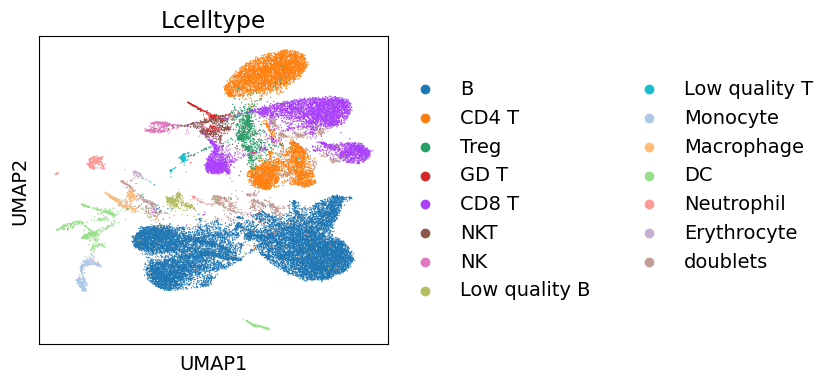

In [31]:
sc.pl.umap(adata,color=['Lcelltype'])

In [32]:
adata.write('./SLN_mergeAll_111_206_MOFA_intersect.h5ad')

#### evaluation

In [33]:
# leiden: resolution=1
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(adata.obsm['X_MOFA'], adata.obs['leiden_MOFA'])
print("The average silhouette_score is :", silhouette_avg)

silhouette_avg = silhouette_score(adata.obsm['X_umap'], adata.obs['leiden_MOFA'])
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.137586082249993
The average silhouette_score is : 0.33657533


### leiden outer

#### load constructed RNA matrix

In [90]:
## inner
import pandas as pd
import scanpy as sc
import numpy as np
import muon as mu

mdata = mu.read_h5mu('SLM_mergeAll_111_206_totalVI_outer.h5mu')
mdata

/home/wangxf/data/tools/miniconda3/envs/cell2loc_env/lib/python3.8/site-packages/mudata/_core/mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


MuData object with n_obs × n_vars = 32648 × 17760
  obs:	'_scvi_labels'
  uns:	'_scvi_manager_uuid', '_scvi_uuid'
  3 modalities
    rna:	32648 x 13553
      obs:	'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
      uns:	'hvg', 'log1p'
      layers:	'counts'
    protein:	32648 x 207
      obs:	'_scvi_batch'
      var:	'clean_names'
      layers:	'denoised_protein', 'protein_foreground_prob'
    rna_subset:	32648 x 4000
      obs:	'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', '_scvi_batch', 'leiden_totalVI'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
      uns:	'hvg', 'leiden', 'log1p', 'neighbors', 'rna_subset:batch_colors', 'rna_subset:leiden_totalVI_colors', 'rna_subset:panel_colors', 'umap'
      obsm:	'X_totalVI', 'X_umap'
      layers:	'counts', 'denoised_rna'
      obsp:	'connectivities', 'distances'

In [91]:
exp = mdata['rna'].X
exp.shape

(32648, 13553)

In [92]:
import anndata as ad
adata = ad.AnnData(X=exp)#, obs=obs_info, var=var_info
adata.obs_names = mdata['rna'].obs_names
adata.var_names = mdata['rna'].var_names

In [93]:
metadata = pd.read_csv('./SLN_mergedAll_metaData.csv',index_col=0)
metadata.head(2)

,n_protein_counts,n_proteins,seurat_hash_id,batch_indices,hash_id,n_genes,percent_mito,leiden_subclusters,cell_types,n_counts,panel,batch
index,,,,,,,,,,,,
p111_AAACCCAAGGGTAATT-1,2319.0,100,Spleen,0,Spleen,3137,0.062138,"12,0",NKT,9836.0,111,0
p111_AAACCCAAGGTAAACT-1,3760.0,105,Spleen,0,Spleen,2256,0.057545,6,CD122+ CD8 T,7453.0,111,0


In [94]:
from collections import Counter
Counter(mdata['rna'].obs_names == metadata.index)

Counter({True: 32648})

In [95]:
embedding = pd.read_csv('SLN_mergeAll_111_206_MOFA_embedding_outer.csv',index_col=0)

In [96]:
adata.obs = metadata
adata.obsm['X_MOFA'] = embedding
# adata.obsm['X_umap'] = embedding_umap
# adata.obs['clusters'+'_'+str(n_clusters)] = labels

In [97]:
adata.obs['panel']=adata.obs['panel'].astype('category')
adata.obs['batch_indices']=adata.obs['batch_indices'].astype('category')
adata.obs['batch']=adata.obs['batch'].astype('category')
# adata.obs['clusters_21']=adata.obs['clusters_21'].astype('category')

In [98]:
sc.pp.neighbors(adata, use_rep='X_MOFA')
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added='leiden_MOFA')

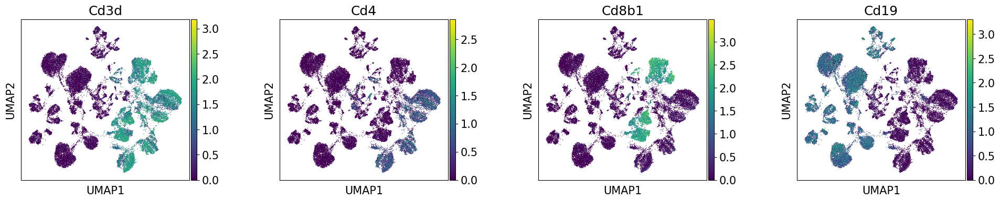

In [99]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.1,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小
# sc.pl.umap(adata,color=['1364','1007','225','1956'],wspace=0.4)
sc.pl.umap(adata,color=['Cd3d','Cd4','Cd8b1','Cd19'],wspace=0.4)

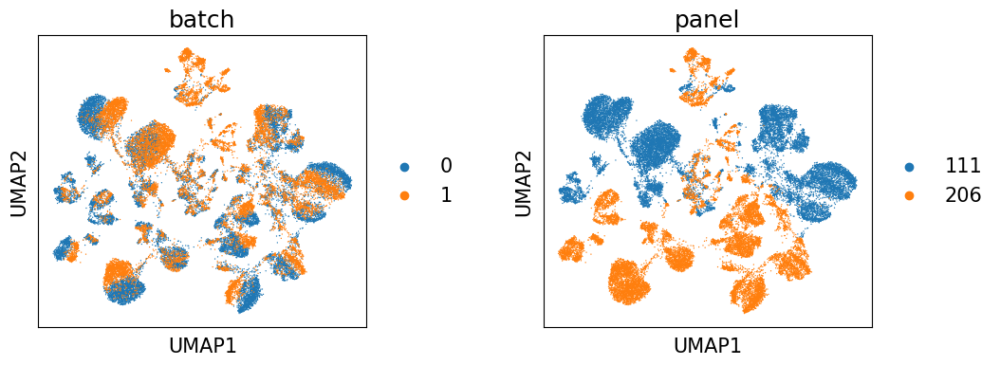

In [100]:
plt.rcParams["figure.figsize"] = (4.1,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小
sc.pl.umap(adata,color=['batch','panel'],wspace=0.4)

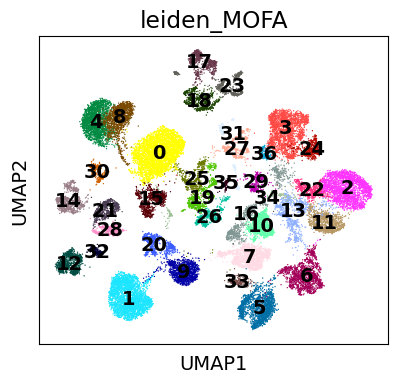

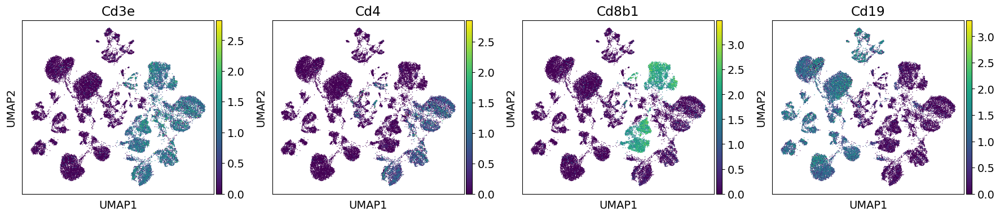

In [101]:
# 设置图的大小
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.5,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小
sc.pl.umap(adata,color=['leiden_MOFA'],legend_loc='on data')
sc.pl.umap(adata,color=['Cd3e','Cd4','Cd8b1','Cd19'],cmap='viridis',frameon=True)

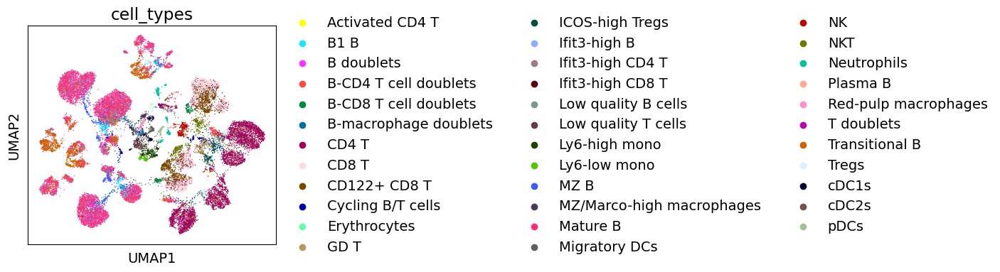

In [102]:
# 设置图的大小
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.5,4)
plt.rcParams.update({'font.size': 14}) #设定全局字体大小
# sc.pl.umap(adata,color=['clusters_21'],legend_loc='on data')
sc.pl.umap(adata,color=['cell_types'])
# sc.pl.umap(adata,color=['Cd3e','Cd4','Cd8b1','Cd19'],cmap='viridis',frameon=True)

In [103]:
reassign_cluster_names = {
    "Neutrophils": "Neutrophil",
    "Plasma B": "B",
    "Red-pulp macrophages": "Macrophage",
    "T doublets": "doublets",
    "Transitional B": "B",
    "Tregs": "Treg",
    "cDC1s": "DC",
    "cDC2s": "DC",
    "pDCs": "DC",
    "B doublets": "doublets",
    "B-CD4 T cell doublets": "doublets",
    "B-CD8 T cell doublets": "doublets",
    "B-macrophage doublets": "doublets",
    "B1 B": "B",
    "CD122+ CD8 T": "CD8 T",
    "CD4 T": "CD4 T",
    "CD8 T": "CD8 T",
    "Cycling B/T cells": "doublets",
    "Erythrocytes": "Erythrocyte",
    "GD T": "GD T",
    "ICOS-high Tregs": "Treg",
    "Activated CD4 T": "CD4 T",
    "Ifit3-high B": "B",
    "Ifit3-high CD4 T": "CD4 T",
    "Ifit3-high CD8 T": "CD8 T",
    "Low quality B cells": "Low quality B",
    "Low quality T cells": "Low quality T",
    "Ly6-high mono": "Monocyte",
    "Ly6-low mono": "Monocyte",
    "MZ B": "B",
    "MZ/Marco-high macrophages": "Macrophage",
    "Mature B": "B",
    "Migratory DCs": "DC",
    "NK": "NK",
    "NKT": "NKT",
}
adata.obs['Lcelltype'] = adata.obs['cell_types'].map(reassign_cluster_names).astype('category')

In [104]:
adata.obs['Lcelltype'] = adata.obs['Lcelltype'].cat.reorder_categories(['B', 'CD4 T','Treg','GD T', 'CD8 T','NKT','NK', 
                                                                         'Low quality B','Low quality T',
                                                                         'Monocyte','Macrophage','DC','Neutrophil', 
                                                                         'Erythrocyte','doublets'])

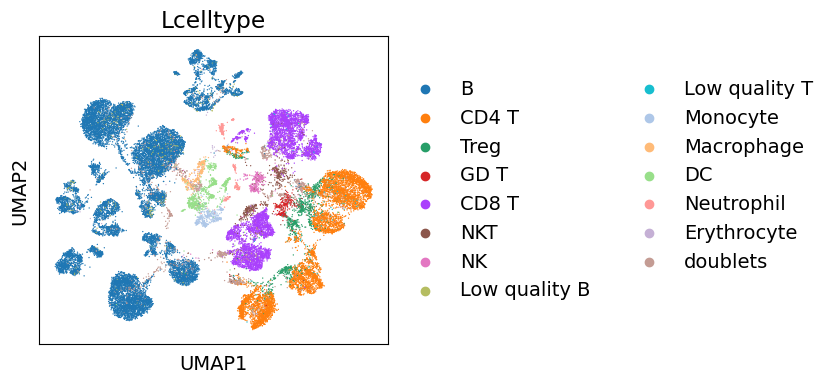

In [105]:
sc.pl.umap(adata,color=['Lcelltype'])

In [106]:
adata.write('./SLN_mergeAll_111_206_MOFA_union.h5ad')

#### evaluation

In [107]:
# leiden: resolution=1
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(adata.obsm['X_MOFA'], adata.obs['leiden_MOFA'])
print("The average silhouette_score is :", silhouette_avg)

silhouette_avg = silhouette_score(adata.obsm['X_umap'], adata.obs['leiden_MOFA'])
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.1159946425947291
The average silhouette_score is : 0.43485188


## MOFA

### inner

In [83]:
import scanpy as sc
import muon as mu
adata = sc.read('./SLN_mergeAll_111_206_MOFA_intersect.h5ad')
adata

AnnData object with n_obs × n_vars = 32648 × 13553
    obs: 'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', 'leiden_MOFA', 'Lcelltype'
    uns: 'Lcelltype_colors', 'batch_colors', 'cell_types_colors', 'leiden', 'leiden_MOFA_colors', 'neighbors', 'panel_colors', 'umap'
    obsm: 'X_MOFA', 'X_umap'
    obsp: 'connectivities', 'distances'

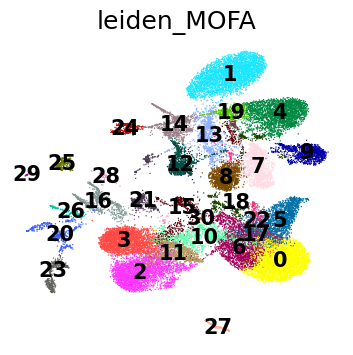

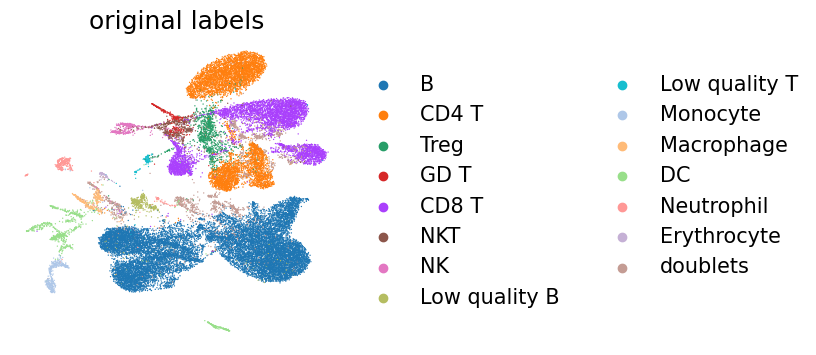

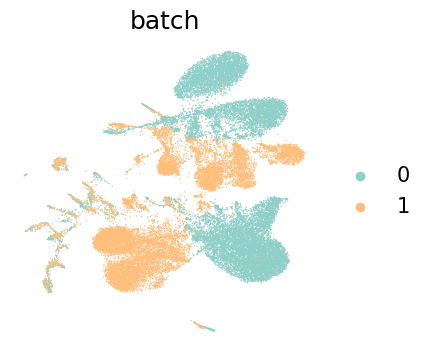

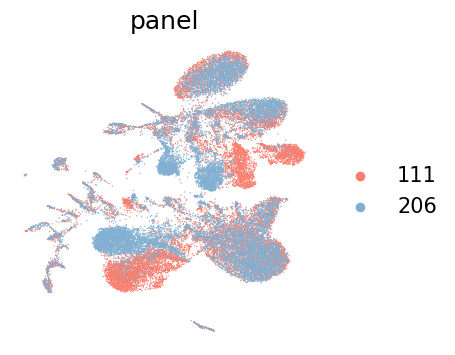

In [84]:
reassign_cluster_names = {
    "Neutrophils": "Neutrophil",
    "Plasma B": "B",
    "Red-pulp macrophages": "Macrophage",
    "T doublets": "doublets",
    "Transitional B": "B",
    "Tregs": "Treg",
    "cDC1s": "DC",
    "cDC2s": "DC",
    "pDCs": "DC",
    "B doublets": "doublets",
    "B-CD4 T cell doublets": "doublets",
    "B-CD8 T cell doublets": "doublets",
    "B-macrophage doublets": "doublets",
    "B1 B": "B",
    "CD122+ CD8 T": "CD8 T",
    "CD4 T": "CD4 T",
    "CD8 T": "CD8 T",
    "Cycling B/T cells": "doublets",
    "Erythrocytes": "Erythrocyte",
    "GD T": "GD T",
    "ICOS-high Tregs": "Treg",
    "Activated CD4 T": "CD4 T",
    "Ifit3-high B": "B",
    "Ifit3-high CD4 T": "CD4 T",
    "Ifit3-high CD8 T": "CD8 T",
    "Low quality B cells": "Low quality B",
    "Low quality T cells": "Low quality T",
    "Ly6-high mono": "Monocyte",
    "Ly6-low mono": "Monocyte",
    "MZ B": "B",
    "MZ/Marco-high macrophages": "Macrophage",
    "Mature B": "B",
    "Migratory DCs": "DC",
    "NK": "NK",
    "NKT": "NKT",
}
# adata.obs['Lcelltype'] = adata.obs['cell_types'].map(reassign_cluster_names).astype('category')

# adata.obs['Lcelltype'] = adata.obs['Lcelltype'].cat.reorder_categories(['B', 'CD4 T','Treg','GD T', 'CD8 T','NKT','NK', 
#                                                                          'Low quality B','Low quality T',
#                                                                          'Monocyte','Macrophage','DC','Neutrophil', 
#                                                                          'Erythrocyte','doublets'])

adata.uns['panel_colors'] = ["#FA7F6F" ,"#82B0D2"]
adata.uns['batch_colors'] = ["#8ECFC9", "#FFBE7A"]

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小

mu.pl.embedding(adata,basis="X_umap",color=["leiden_MOFA"],title='leiden_MOFA',
    frameon=False,legend_loc='on data',ncols=1)
mu.pl.embedding(adata,basis="X_umap",color=["Lcelltype"],title='original labels',
    frameon=False,ncols=1)

plt.rcParams["figure.figsize"] = (4,4)
mu.pl.embedding(adata,basis="X_umap",color=[ "batch"],title='batch',
    frameon=False,ncols=1)

mu.pl.embedding(adata,basis="X_umap",color=[ "panel"],title='panel',
    frameon=False,ncols=1)

### outer

In [108]:
import scanpy as sc
import muon as mu
adata = sc.read_h5ad('./SLN_mergeAll_111_206_MOFA_union.h5ad')
adata

AnnData object with n_obs × n_vars = 32648 × 13553
    obs: 'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'n_counts', 'panel', 'batch', 'leiden_MOFA', 'Lcelltype'
    uns: 'Lcelltype_colors', 'batch_colors', 'cell_types_colors', 'leiden', 'leiden_MOFA_colors', 'neighbors', 'panel_colors', 'umap'
    obsm: 'X_MOFA', 'X_umap'
    obsp: 'connectivities', 'distances'

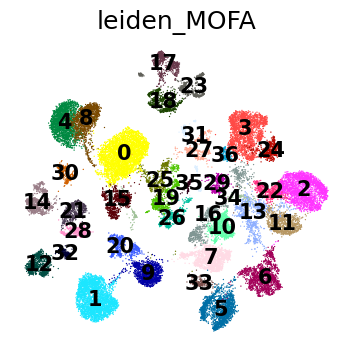

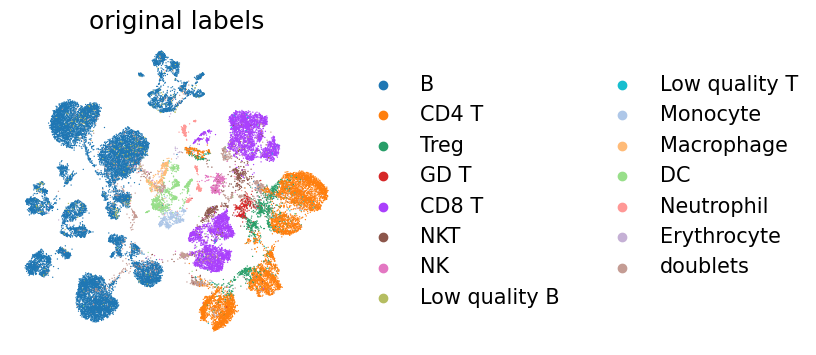

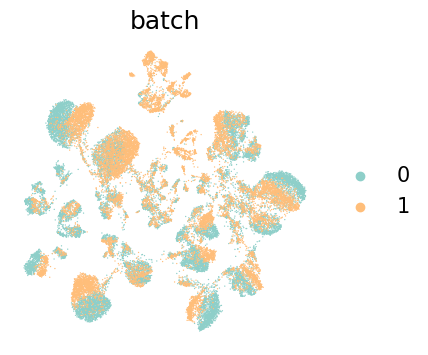

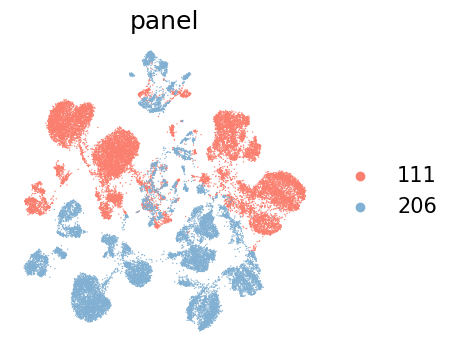

In [109]:
reassign_cluster_names = {
    "Neutrophils": "Neutrophil",
    "Plasma B": "B",
    "Red-pulp macrophages": "Macrophage",
    "T doublets": "doublets",
    "Transitional B": "B",
    "Tregs": "Treg",
    "cDC1s": "DC",
    "cDC2s": "DC",
    "pDCs": "DC",
    "B doublets": "doublets",
    "B-CD4 T cell doublets": "doublets",
    "B-CD8 T cell doublets": "doublets",
    "B-macrophage doublets": "doublets",
    "B1 B": "B",
    "CD122+ CD8 T": "CD8 T",
    "CD4 T": "CD4 T",
    "CD8 T": "CD8 T",
    "Cycling B/T cells": "doublets",
    "Erythrocytes": "Erythrocyte",
    "GD T": "GD T",
    "ICOS-high Tregs": "Treg",
    "Activated CD4 T": "CD4 T",
    "Ifit3-high B": "B",
    "Ifit3-high CD4 T": "CD4 T",
    "Ifit3-high CD8 T": "CD8 T",
    "Low quality B cells": "Low quality B",
    "Low quality T cells": "Low quality T",
    "Ly6-high mono": "Monocyte",
    "Ly6-low mono": "Monocyte",
    "MZ B": "B",
    "MZ/Marco-high macrophages": "Macrophage",
    "Mature B": "B",
    "Migratory DCs": "DC",
    "NK": "NK",
    "NKT": "NKT",
}
# adata.obs['Lcelltype'] = adata.obs['cell_types'].map(reassign_cluster_names).astype('category')

# adata.obs['Lcelltype'] = adata.obs['Lcelltype'].cat.reorder_categories(['B', 'CD4 T','Treg','GD T', 'CD8 T','NKT','NK', 
#                                                                          'Low quality B','Low quality T',
#                                                                          'Monocyte','Macrophage','DC','Neutrophil', 
#                                                                          'Erythrocyte','doublets'])

adata.uns['panel_colors'] = ["#FA7F6F" ,"#82B0D2"]
adata.uns['batch_colors'] = ["#8ECFC9", "#FFBE7A"]

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (4.3,4)
plt.rcParams.update({'font.size': 15}) #设定全局字体大小

mu.pl.embedding(adata,basis="X_umap",color=["leiden_MOFA"],title='leiden_MOFA',
    frameon=False,legend_loc='on data',ncols=1)
mu.pl.embedding(adata,basis="X_umap",color=["Lcelltype"],title='original labels',
    frameon=False,ncols=1)

plt.rcParams["figure.figsize"] = (4,4)
mu.pl.embedding(adata,basis="X_umap",color=[ "batch"],title='batch',
    frameon=False,ncols=1)

mu.pl.embedding(adata,basis="X_umap",color=[ "panel"],title='panel',
    frameon=False,ncols=1)